<h3>Introduction to Case Study</h3><br>
Lending Club is the largest online loan facilitating marketplace for personal loans, business loans and financing for medical procedures.<br>
People in need can easily access loans with lower interest rates through their online portal.<br>
Many of the lending companies goes through credit loss, which is the amount of money lost when the borrower refuses to pay or runs away with the money owed.<br>
Our agenda here is to analysis the factors which contribute/influence the Defaulted cases, so that we can save the business from huge losses.

## Importing Libraries

In [247]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

import math

sns.set(color_codes=True)

import warnings
warnings.filterwarnings('ignore')

### Setting params for basic graphs

In [248]:
large = 22; med = 16; small = 12

## Loading the data

In [249]:
data = pd.read_csv('./loan.csv')
display(data.head())

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


Shape of the data: (39717, 111)


In [250]:
display(data.tail())

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
39712,92187,92174,2500,2500,1075.0,36 months,8.07%,78.42,A,A4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39713,90665,90607,8500,8500,875.0,36 months,10.28%,275.38,C,C1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39714,90395,90390,5000,5000,1325.0,36 months,8.07%,156.84,A,A4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39715,90376,89243,5000,5000,650.0,36 months,7.43%,155.38,A,A2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39716,87023,86999,7500,7500,800.0,36 months,13.75%,255.43,E,E2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Data Understanding

In [481]:
print("Shape of the data: {}".format(data.shape))

Shape of the data: (35943, 20)


#### A few functions for easy access to information
<ol>
    <li>
        get_all_types:<br>
        use: get data types of all the columns in a dataframe<br>
        parameters: data(default data) - the dataframe we need to get column types for<br>
        returns: show_types - a dictionary of column names as keys and their types as values
    </li>
    <li>
        get_info:<br>
        use: return information such as null values in columns x, datatype of column x in a dataframe
        parameters: col_name - name of column to get info of
                    data(default data) - the dataframe
        returns: the sum of null values present in the column and type of column
    </li>
    <li>
        set_plot_stats:<br>
        use: set formats and sizes of various plot based features
        parameters: SMALL_SIZE, MEDIUM_SIZE, BIGGER_SIZE - different sizes usefull, defaults set at the top of the sheet
        returns: none
    </li>
        <li>
        annot_bar_plot:<br>
        use: to annot bar plots with values of the bars
        parameters: plots - pass the plot we wanted annotated
        returns: none
    </li>
</ol>

In [251]:
def get_all_types(data=data):
    show_types = {}
    for i in data.columns:
        show_types[i] = data[i].dtypes
    return show_types    

def get_info(col_name, data=data):
    return data[col_name].isnull().sum(), data[col_name].dtypes

def set_plot_stats(SMALL_SIZE=small, MEDIUM_SIZE=med, BIGGER_SIZE=large):
    plt.rc('font', size=MEDIUM_SIZE)          # controls default text sizes
    plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
    plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=MEDIUM_SIZE)    # fontsize of the tick labels
    plt.rc('legend', fontsize=MEDIUM_SIZE)    # legend fontsize
    plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

    
def annot_bar_plot(plots):
    for bar in plots.patches:
        plots.annotate(format(bar.get_height(), '.2f'),
                           (bar.get_x() + bar.get_width() / 2,
                            bar.get_height()), ha='center', va='center',
                           size=15, xytext=(0, 8),
                           textcoords='offset points')

Looking at our target variable <b>loan_status</b>

In [252]:
print(data.loan_status.value_counts())

Fully Paid     32950
Charged Off     5627
Current         1140
Name: loan_status, dtype: int64


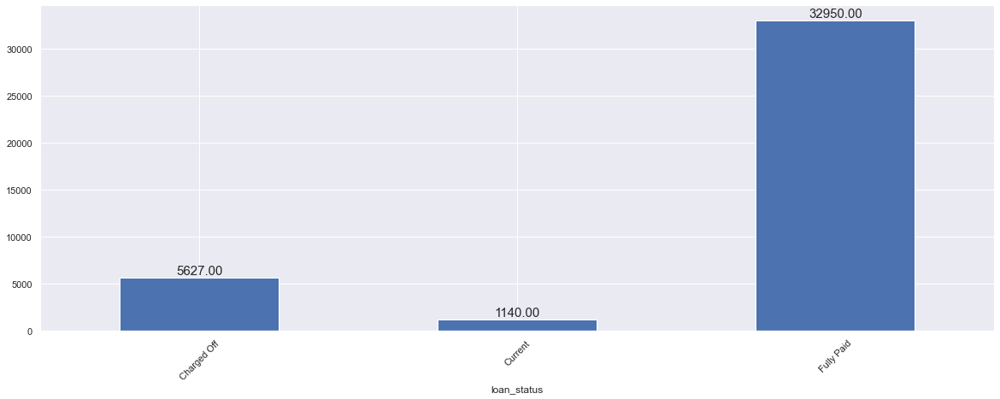

In [253]:
plt.figure(figsize=(20,7))
plots = data.groupby('loan_status').loan_amnt.count().plot.bar()
annot_bar_plot(plots)
plt.xticks(rotation=45)
plt.show()

Removing the <b>current status</b> borrowers as our task is to work on understanding factors for defaulters at the time of loan inception

In [254]:
print("Shape before removing the rows: {}".format(data.shape)) 
data = data[data.loan_status != 'Current']
print("Shape after removing the rows: {}".format(data.shape)) 

Shape before removing the rows: (39717, 111)
Shape after removing the rows: (38577, 111)


We removed 1140 rows in the process

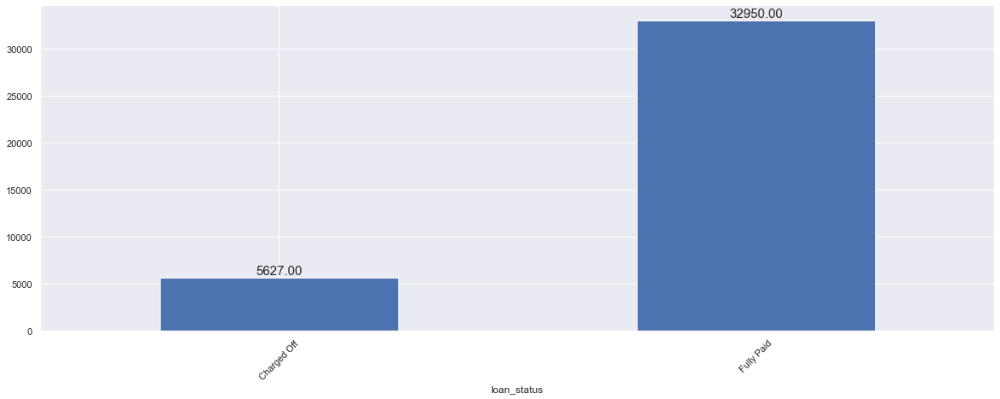

In [255]:
plt.figure(figsize=(20,7))
plots = data.groupby('loan_status').loan_amnt.count().plot.bar()
annot_bar_plot(plots)
plt.xticks(rotation=45)
plt.show()

In [256]:
print("Missing Value count: {}\nData type: {}".format(get_info('loan_status')[0], get_info('loan_status')[1]))

Missing Value count: 0
Data type: object


Getting data type of all the columns

In [257]:
get_all_types()

{'id': dtype('int64'),
 'member_id': dtype('int64'),
 'loan_amnt': dtype('int64'),
 'funded_amnt': dtype('int64'),
 'funded_amnt_inv': dtype('float64'),
 'term': dtype('O'),
 'int_rate': dtype('O'),
 'installment': dtype('float64'),
 'grade': dtype('O'),
 'sub_grade': dtype('O'),
 'emp_title': dtype('O'),
 'emp_length': dtype('O'),
 'home_ownership': dtype('O'),
 'annual_inc': dtype('float64'),
 'verification_status': dtype('O'),
 'issue_d': dtype('O'),
 'loan_status': dtype('O'),
 'pymnt_plan': dtype('O'),
 'url': dtype('O'),
 'desc': dtype('O'),
 'purpose': dtype('O'),
 'title': dtype('O'),
 'zip_code': dtype('O'),
 'addr_state': dtype('O'),
 'dti': dtype('float64'),
 'delinq_2yrs': dtype('int64'),
 'earliest_cr_line': dtype('O'),
 'inq_last_6mths': dtype('int64'),
 'mths_since_last_delinq': dtype('float64'),
 'mths_since_last_record': dtype('float64'),
 'open_acc': dtype('int64'),
 'pub_rec': dtype('int64'),
 'revol_bal': dtype('int64'),
 'revol_util': dtype('O'),
 'total_acc': dtyp

Getting percentage of emptiness of columns

In [258]:
((data.isnull().sum()/data.shape[0])*100).sort_values(ascending=False)

total_il_high_credit_limit    100.0
il_util                       100.0
bc_util                       100.0
bc_open_to_buy                100.0
avg_cur_bal                   100.0
                              ...  
pub_rec                         0.0
open_acc                        0.0
inq_last_6mths                  0.0
earliest_cr_line                0.0
id                              0.0
Length: 111, dtype: float64

Visualizing the same for better clarity

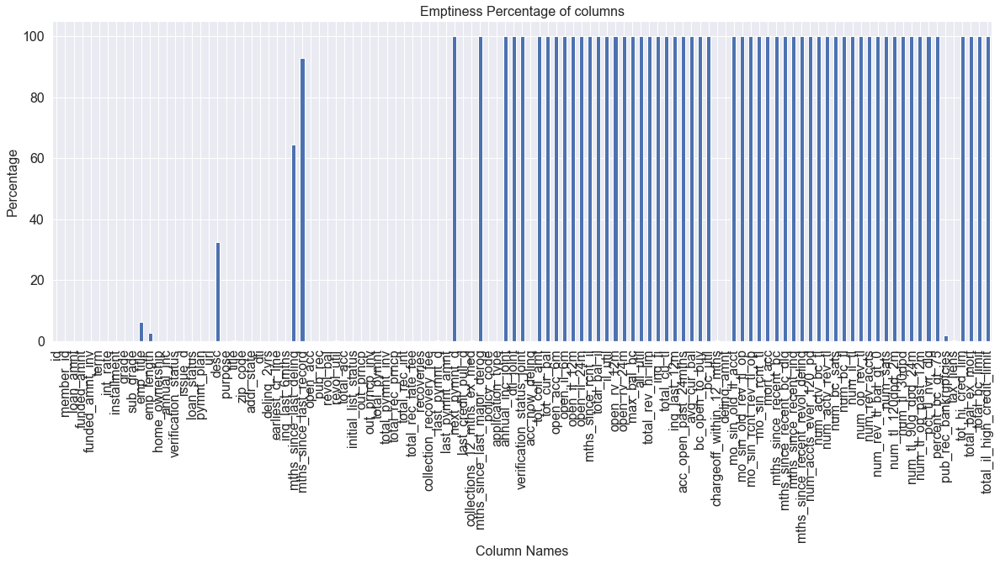

In [259]:
set_plot_stats()
((data.isnull().sum()/data.shape[0])*100).plot(kind='bar', figsize=(20, 7))
plt.xticks(rotation=90)
plt.title('Emptiness Percentage of columns')
plt.xlabel('Column Names')
plt.ylabel('Percentage')
plt.show()

As we can clearly see there are a number od columns that are fully empty

A list of the columns with more than 80% null values are

In [260]:
null_pct = data.isnull().sum()/data.shape[0]
print("Total columns with 80% missing values: {}\n".format(len(null_pct[null_pct>0.8])))
print(null_pct[null_pct>0.8])

Total columns with 80% missing values: 56

mths_since_last_record            0.928973
next_pymnt_d                      1.000000
mths_since_last_major_derog       1.000000
annual_inc_joint                  1.000000
dti_joint                         1.000000
verification_status_joint         1.000000
tot_coll_amt                      1.000000
tot_cur_bal                       1.000000
open_acc_6m                       1.000000
open_il_6m                        1.000000
open_il_12m                       1.000000
open_il_24m                       1.000000
mths_since_rcnt_il                1.000000
total_bal_il                      1.000000
il_util                           1.000000
open_rv_12m                       1.000000
open_rv_24m                       1.000000
max_bal_bc                        1.000000
all_util                          1.000000
total_rev_hi_lim                  1.000000
inq_fi                            1.000000
total_cu_tl                       1.000000
inq_last_12

Removing these 56 columns

In [261]:
print("Shape before removing the columns: {}".format(data.shape)) 
null_lim = 0.2*data.shape[0] #only 20% null values allowed in a single column
data.dropna(thresh=null_lim, axis=1, inplace=True)
print("Shape after removing the columns: {}".format(data.shape)) 

Shape before removing the columns: (38577, 111)
Shape after removing the columns: (38577, 55)


In [262]:
#looking at the remaining columns
data.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose',
       'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'mths_since_last_delinq',
       'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'initial_list_status', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d',
       'collections_12_mths_ex_med', 'policy_code', 'application_type',
       'acc_now_delinq', 'chargeoff_within_12_mths', 'delinq_amnt',
       'pub_rec_bankruptcies', 'tax_liens'],
      dtype='object')

<AxesSubplot:>

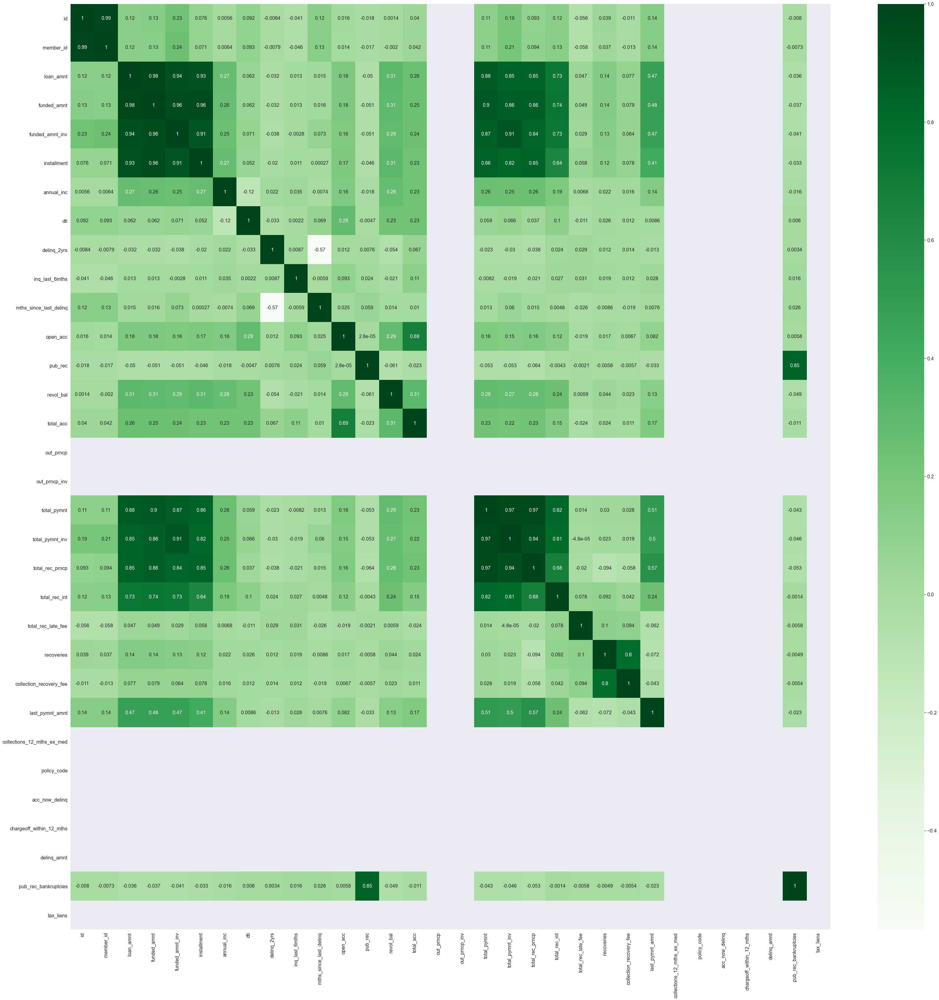

In [263]:
plt.figure(figsize=(55, 55))
sns.heatmap(data.corr(), cmap='Greens', annot=True)

### Removing the uncessary columns

From the above correlation matrix:<br>
columns - out_prncp, out_prncp_inv, collections_12_mths_ex_med, policy_code, acc_now_delinq, chargeoff_within_12_mths, delinq_amnt, tax_liens are not at all corelated to any other variables 

In [264]:
non_corr_cols = ['out_prncp', 'out_prncp_inv', 'collections_12_mths_ex_med', 'policy_code', 'acc_now_delinq', 'chargeoff_within_12_mths', 'delinq_amnt', 'tax_liens']

In [265]:
data[non_corr_cols].nunique()

out_prncp                     1
out_prncp_inv                 1
collections_12_mths_ex_med    1
policy_code                   1
acc_now_delinq                1
chargeoff_within_12_mths      1
delinq_amnt                   1
tax_liens                     1
dtype: int64

In [266]:
print("Number of these columns: {}".format(len(non_corr_cols)))

Number of these columns: 8


1. From the above correlation matrix:
    <ol>
    <li>columns - out_prncp, out_prncp_inv, collections_12_mths_ex_med, policy_code, acc_now_delinq, chargeoff_within_12_mths, delinq_amnt, tax_liens are not at all corelated to any other variables.
    </li>     
    <li>exploring further it looks like this is due to the reason that these columns have a single value thus will not be affecting any other variables
    </li>
    <li>
    We will be removing these columns as they are of no use in out analysis
    </li>
    </ol>

In [267]:
print("Shape before removing the columns: {}".format(data.shape)) 
data.drop(non_corr_cols, axis=1, inplace=True)
print("Shape after removing the columns: {}".format(data.shape)) 

Shape before removing the columns: (38577, 55)
Shape after removing the columns: (38577, 47)


Dropped 8 columns

2. Dropping id Columns
    Reson: both id and member_id columns contain unique values and will not be usefull for our analysis and thus could be removed

In [268]:
data[['id', 'member_id']].nunique()

id           38577
member_id    38577
dtype: int64

In [269]:
id_columns = ['id', 'member_id']
print("Shape before removing the columns: {}".format(data.shape)) 
data.drop(id_columns, axis=1, inplace=True)
print("Shape after removing the columns: {}".format(data.shape)) 

Shape before removing the columns: (38577, 47)
Shape after removing the columns: (38577, 45)


Removed 2 columns

3. Behavioural variable: these are the columns that contain information regarding borrowers after their loan was approved or they can be easily available, so we can do away with these.

In [270]:
data.columns

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'grade', 'sub_grade', 'emp_title', 'emp_length',
       'home_ownership', 'annual_inc', 'verification_status', 'issue_d',
       'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose', 'title',
       'zip_code', 'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'mths_since_last_delinq', 'open_acc', 'pub_rec',
       'revol_bal', 'revol_util', 'total_acc', 'initial_list_status',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d',
       'application_type', 'pub_rec_bankruptcies'],
      dtype='object')

In [271]:
behavioural_columns = ['delinq_2yrs', 'earliest_cr_line', 'open_acc', 'revol_bal',
      'revol_util', 'total_acc', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
      'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d']

print("Shape before removing the columns: {}".format(data.shape))
data.drop(behavioural_columns, axis=1, inplace=True)
print("Shape after removing the columns: {}".format(data.shape))

Shape before removing the columns: (38577, 45)
Shape after removing the columns: (38577, 29)


Removed 16 columns

4. Checking and removing if there are still columns with single values that will be not too meaning for our analysis

In [272]:
data.columns

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'grade', 'sub_grade', 'emp_title', 'emp_length',
       'home_ownership', 'annual_inc', 'verification_status', 'issue_d',
       'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose', 'title',
       'zip_code', 'addr_state', 'dti', 'inq_last_6mths',
       'mths_since_last_delinq', 'pub_rec', 'initial_list_status',
       'application_type', 'pub_rec_bankruptcies'],
      dtype='object')

In [273]:
data.value_counts

<bound method DataFrame.value_counts of        loan_amnt  funded_amnt  funded_amnt_inv        term int_rate  \
0           5000         5000           4975.0   36 months   10.65%   
1           2500         2500           2500.0   60 months   15.27%   
2           2400         2400           2400.0   36 months   15.96%   
3          10000        10000          10000.0   36 months   13.49%   
5           5000         5000           5000.0   36 months    7.90%   
...          ...          ...              ...         ...      ...   
39712       2500         2500           1075.0   36 months    8.07%   
39713       8500         8500            875.0   36 months   10.28%   
39714       5000         5000           1325.0   36 months    8.07%   
39715       5000         5000            650.0   36 months    7.43%   
39716       7500         7500            800.0   36 months   13.75%   

       installment grade sub_grade                   emp_title emp_length  \
0           162.87     B      

We see a few columns may still have single values

In [274]:
#Remove Columns with single unique value
#initial_list_status has only values f, pymnt_plan, policy_code
single_valued_cols = [x for x, y in dict(data.nunique()).items() if y==1]
print('Remaining single valued columns are: {}'.format(single_valued_cols))
# data.nunique().sort_values()b

Remaining single valued columns are: ['pymnt_plan', 'initial_list_status', 'application_type']


In [275]:
for i in single_valued_cols:
    display(data[i].value_counts())

n    38577
Name: pymnt_plan, dtype: int64

f    38577
Name: initial_list_status, dtype: int64

INDIVIDUAL    38577
Name: application_type, dtype: int64

Clearly:
    pymnt_plan only have single value 'n'
    initial_list_status  only have single value 'f'
    application_type only have single value  'INDIVIDUAL'
Thus we can remove these columns too as they will not impact our analysis

In [276]:
print("Shape before removing the columns: {}".format(data.shape))
data.drop(single_valued_cols, axis=1, inplace=True)
print("Shape after removing the columns: {}".format(data.shape))

Shape before removing the columns: (38577, 29)
Shape after removing the columns: (38577, 26)


Removed 3 more columns

5. Removing other non-relevant columns

In [277]:
data.columns

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'grade', 'sub_grade', 'emp_title', 'emp_length',
       'home_ownership', 'annual_inc', 'verification_status', 'issue_d',
       'loan_status', 'url', 'desc', 'purpose', 'title', 'zip_code',
       'addr_state', 'dti', 'inq_last_6mths', 'mths_since_last_delinq',
       'pub_rec', 'pub_rec_bankruptcies'],
      dtype='object')

In [278]:
non_relevent_cols = []

'\n0.00-0.19: very weak\n0.20-0.39: weak\n0.40-0.59: moderate \n0.60-0.79: strong\n0.80-1.00: very strong.\n'

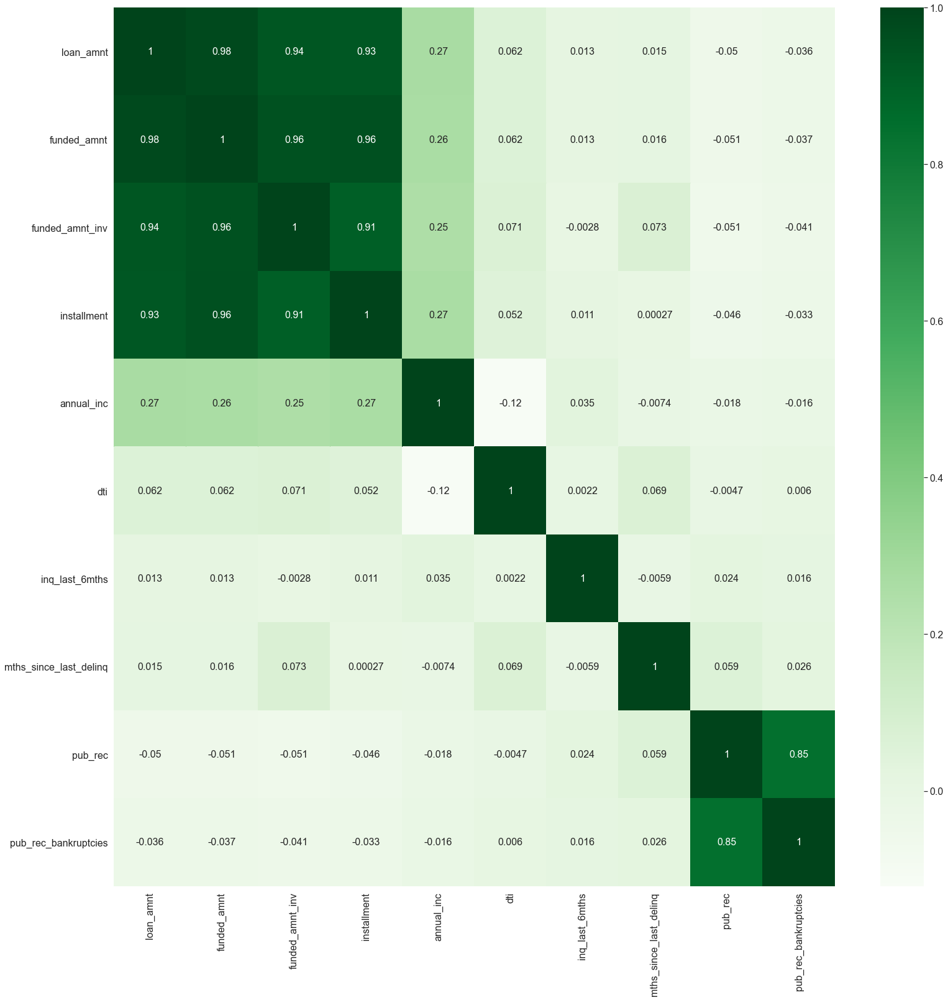

In [279]:
plt.figure(figsize=(26, 26))
sns.heatmap(data.corr(), cmap='Greens', annot=True)
"""
0.00-0.19: very weak
0.20-0.39: weak
0.40-0.59: moderate 
0.60-0.79: strong
0.80-1.00: very strong.
"""

Looking at the heatmap, it is clear that there is a very high corelation between pub_rec and pub_rec_bankrupcies so we can drop either of the variables as to reduce redundencies.
We are choosing to drop pub_rec_bankrupcies

In [280]:
non_relevent_cols.append('pub_rec_bankruptcies')

In [281]:
# looking at these columns as they may not hold a lot of relevent information
data[['url', 'desc', 'purpose', 'title']]

,url,desc,purpose,title
0,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer
1,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike
2,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business
3,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel
5,https://lendingclub.com/browse/loanDetail.acti...,NaN,wedding,My wedding loan I promise to pay back
...,...,...,...,...
39712,https://lendingclub.com/browse/loanDetail.acti...,Our current gutter system on our home is old a...,home_improvement,Home Improvement
39713,https://lendingclub.com/browse/loanDetail.acti...,The rate of interest and fees incurred by carr...,credit_card,Retiring credit card debt
39714,https://lendingclub.com/browse/loanDetail.acti...,NaN,debt_consolidation,MBA Loan Consolidation
39715,https://lendingclub.com/browse/loanDetail.acti...,NaN,other,JAL Loan


In [282]:
display(data['url'].value_counts())
display(data['desc'].value_counts())
display(data['purpose'].value_counts())
display(data['title'].value_counts())

https://lendingclub.com/browse/loanDetail.action?loan_id=362270    1
https://lendingclub.com/browse/loanDetail.action?loan_id=533380    1
https://lendingclub.com/browse/loanDetail.action?loan_id=725587    1
https://lendingclub.com/browse/loanDetail.action?loan_id=594521    1
https://lendingclub.com/browse/loanDetail.action?loan_id=746589    1
                                                                  ..
https://lendingclub.com/browse/loanDetail.action?loan_id=508828    1
https://lendingclub.com/browse/loanDetail.action?loan_id=481202    1
https://lendingclub.com/browse/loanDetail.action?loan_id=605995    1
https://lendingclub.com/browse/loanDetail.action?loan_id=594789    1
https://lendingclub.com/browse/loanDetail.action?loan_id=643165    1
Name: url, Length: 38577, dtype: int64

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          209
Debt Consolidation                                                                                                                                                                                                                                                                                        

debt_consolidation    18055
credit_card            5027
other                  3865
home_improvement       2875
major_purchase         2150
small_business         1754
car                    1499
wedding                 926
medical                 681
moving                  576
vacation                375
house                   367
educational             325
renewable_energy        102
Name: purpose, dtype: int64

Debt Consolidation           2090
Debt Consolidation Loan      1620
Personal Loan                 641
Consolidation                 491
debt consolidation            478
                             ... 
driveway installment            1
Four Winns 268 Vista Boat       1
down payment for a home         1
medical expense                 1
Franchise Purchase              1
Name: title, Length: 19297, dtype: int64

In [283]:
#url and desc can be dropped: contains unique single values
non_relevent_cols.append('url')
non_relevent_cols.append('desc')

#purpose and title almost represent the same things, but looking closely purpose will be much better suited for our analysis as it contains consolidated values 

In [284]:
non_relevent_cols.append('title')
#also removing zip_code as we can use addr_state instead
non_relevent_cols.append('zip_code')

In [285]:
print("Shape before removing the columns: {}".format(data.shape))
data.drop(non_relevent_cols, axis=1, inplace=True)
print("Shape after removing the columns: {}".format(data.shape))

Shape before removing the columns: (38577, 26)
Shape after removing the columns: (38577, 21)


Removed 5 Columns

6. Removing columns with high number of unique value

Text(0.5, 1.0, 'Percentage of Unique values in the dataframe')

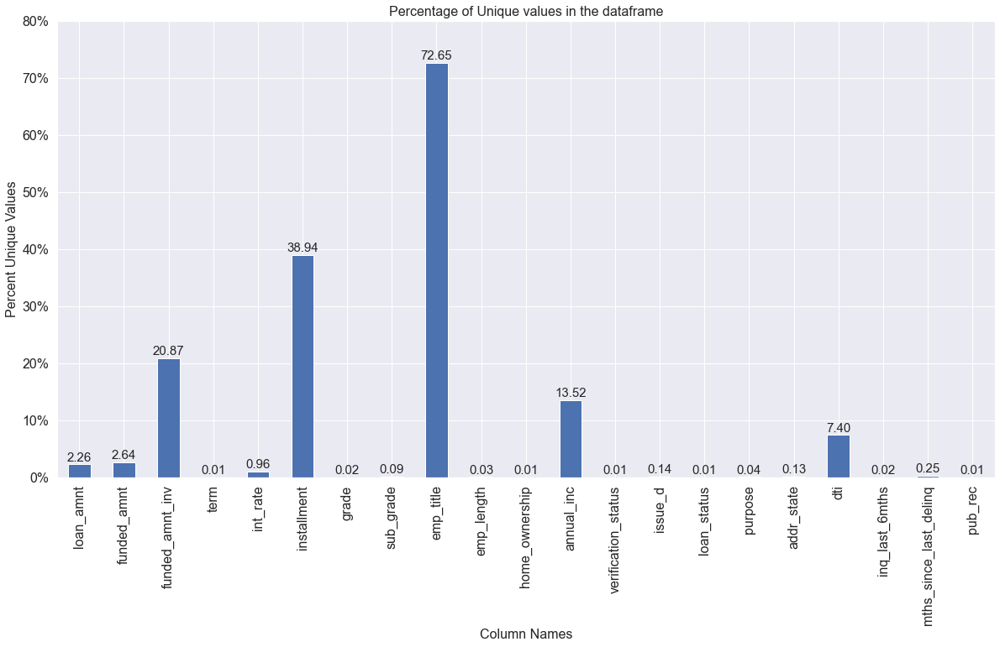

In [286]:
plt.figure(figsize=(20, 10))
plots = ((data.nunique()/data.shape[0])*100).plot(kind='bar')
plt.yticks(ticks=plt.yticks()[0], labels=[str(int(x))+'%' for x in plt.yticks()[0]])

annot_bar_plot(plots)

plt.ylabel('Percent Unique Values')
plt.xlabel('Column Names')
plt.title('Percentage of Unique values in the dataframe')

As we can see <b>emp_title</b> has a high percentage of unique values, so it would not provide a lot of information to our analysis, so we can drop it.

There are a total of 72.6% unique values in this column

In [287]:
print("Shape before removing the columns: {}".format(data.shape))
data.drop("emp_title", axis=1, inplace=True) 
print("Shape after removing the columns: {}".format(data.shape))

Shape before removing the columns: (38577, 21)
Shape after removing the columns: (38577, 20)


In [288]:
data.columns

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'grade', 'sub_grade', 'emp_length', 'home_ownership',
       'annual_inc', 'verification_status', 'issue_d', 'loan_status',
       'purpose', 'addr_state', 'dti', 'inq_last_6mths',
       'mths_since_last_delinq', 'pub_rec'],
      dtype='object')

In [289]:
data

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,addr_state,dti,inq_last_6mths,mths_since_last_delinq,pub_rec
0,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,credit_card,AZ,27.65,1,NaN,0
1,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,car,GA,1.00,5,NaN,0
2,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,small_business,IL,8.72,2,NaN,0
3,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,other,CA,20.00,1,35.0,0
5,5000,5000,5000.0,36 months,7.90%,156.46,A,A4,3 years,RENT,36000.0,Source Verified,Dec-11,Fully Paid,wedding,AZ,11.20,3,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,2500,2500,1075.0,36 months,8.07%,78.42,A,A4,4 years,MORTGAGE,110000.0,Not Verified,Jul-07,Fully Paid,home_improvement,CO,11.33,0,0.0,0
39713,8500,8500,875.0,36 months,10.28%,275.38,C,C1,3 years,RENT,18000.0,Not Verified,Jul-07,Fully Paid,credit_card,NC,6.40,1,5.0,0
39714,5000,5000,1325.0,36 months,8.07%,156.84,A,A4,< 1 year,MORTGAGE,100000.0,Not Verified,Jul-07,Fully Paid,debt_consolidation,MA,2.30,0,0.0,0
39715,5000,5000,650.0,36 months,7.43%,155.38,A,A2,< 1 year,MORTGAGE,200000.0,Not Verified,Jul-07,Fully Paid,other,MD,3.72,0,0.0,0


### Data Type

In [290]:
get_all_types(data)

{'loan_amnt': dtype('int64'),
 'funded_amnt': dtype('int64'),
 'funded_amnt_inv': dtype('float64'),
 'term': dtype('O'),
 'int_rate': dtype('O'),
 'installment': dtype('float64'),
 'grade': dtype('O'),
 'sub_grade': dtype('O'),
 'emp_length': dtype('O'),
 'home_ownership': dtype('O'),
 'annual_inc': dtype('float64'),
 'verification_status': dtype('O'),
 'issue_d': dtype('O'),
 'loan_status': dtype('O'),
 'purpose': dtype('O'),
 'addr_state': dtype('O'),
 'dti': dtype('float64'),
 'inq_last_6mths': dtype('int64'),
 'mths_since_last_delinq': dtype('float64'),
 'pub_rec': dtype('int64')}

Converting object type to numeric if required

In [291]:
object_type_list = []
for x, y in (get_all_types()).items():
    if y == object:
        object_type_list.append(x)
object_type_list

['term',
 'int_rate',
 'grade',
 'sub_grade',
 'emp_title',
 'emp_length',
 'home_ownership',
 'verification_status',
 'issue_d',
 'loan_status',
 'pymnt_plan',
 'url',
 'desc',
 'purpose',
 'title',
 'zip_code',
 'addr_state',
 'earliest_cr_line',
 'revol_util',
 'initial_list_status',
 'last_pymnt_d',
 'next_pymnt_d',
 'last_credit_pull_d',
 'application_type']

Converting <b>int_rate</b> to numeric value

In [292]:
print("Number of nulls in int_rate column: {}\nType of int_rate column: {}".format(get_info('int_rate')[0], get_info('int_rate')[1]))
print("\nDifferent Values in int_rate column")
print(data['int_rate'].value_counts())

Number of nulls in int_rate column: 0
Type of int_rate column: object

Different Values in int_rate column
10.99%    913
11.49%    790
7.51%     787
13.49%    749
7.88%     725
         ... 
14.67%      1
16.20%      1
24.40%      1
17.54%      1
16.15%      1
Name: int_rate, Length: 370, dtype: int64


In [293]:
data.loc[:, 'int_rate'] = data['int_rate'].str.rstrip('%').astype('float64')/100
object_type_list.remove('int_rate')
print(data['int_rate'].value_counts())

0.1099    913
0.1149    790
0.0751    787
0.1349    749
0.0788    725
         ... 
0.1734      1
0.1872      1
0.1601      1
0.1467      1
0.2264      1
Name: int_rate, Length: 370, dtype: int64


Getting Month from issue_d column

In [294]:
print("Number of nulls in issue_d column: {}\nType of issue_d column: {}".format(get_info('issue_d')[0], get_info('issue_d')[1]))
print("\nDifferent Values in issue_d column")
print(data['issue_d'].value_counts())

Number of nulls in issue_d column: 0
Type of issue_d column: object

Different Values in issue_d column
Nov-11    2062
Dec-11    2042
Oct-11    1941
Sep-11    1913
Aug-11    1798
Jul-11    1745
Jun-11    1728
May-11    1609
Apr-11    1559
Mar-11    1442
Jan-11    1380
Feb-11    1297
Dec-10    1267
Oct-10    1132
Nov-10    1121
Jul-10    1119
Sep-10    1086
Aug-10    1078
Jun-10    1029
May-10     920
Apr-10     827
Mar-10     737
Feb-10     627
Nov-09     602
Dec-09     598
Jan-10     589
Oct-09     545
Sep-09     449
Aug-09     408
Jul-09     374
Jun-09     356
May-09     319
Apr-09     290
Mar-09     276
Feb-09     260
Jan-09     239
Mar-08     236
Dec-08     223
Nov-08     184
Feb-08     174
Jan-08     171
Apr-08     155
Oct-08      96
Dec-07      85
Jul-08      83
Aug-08      71
May-08      71
Jun-08      66
Oct-07      47
Nov-07      37
Aug-07      33
Sep-08      32
Jul-07      30
Sep-07      18
Jun-07       1
Name: issue_d, dtype: int64


In [295]:
data['issue_d'] = data['issue_d'].apply(pd.to_datetime, format='%b-%y')
data['issue_month'] = data['issue_d'].dt.month
data.drop('issue_d', axis=1, inplace=True)
data.issue_month = data.issue_month.astype('str')
print("\nType of issue_d column: {}".format(get_info('issue_month', data)[1]))
print("\nDifferent Values in issue_month column")
print(data['issue_month'].value_counts())


Type of issue_d column: object

Different Values in issue_month column
12    4215
11    4006
10    3761
9     3498
8     3388
7     3351
6     3180
5     2919
4     2831
3     2691
1     2379
2     2358
Name: issue_month, dtype: int64


More info on loan_status

In [296]:
print("\nType of loan_status column: {}".format(get_info('loan_status')[1]))
print("\nDifferent Values in loan_status column")
print(data['loan_status'].value_counts())


Type of loan_status column: object

Different Values in loan_status column
Fully Paid     32950
Charged Off     5627
Name: loan_status, dtype: int64


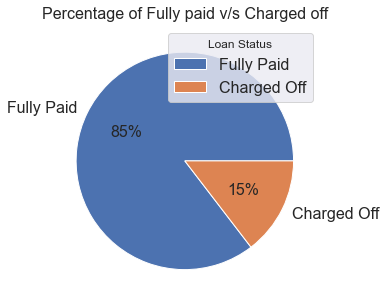

In [297]:
#Plotting to see loan status
plt.figure(figsize=(7, 5))
data['loan_status'].value_counts().plot(kind='pie', autopct='%.0f%%')
plt.title('Percentage of Fully paid v/s Charged off')
plt.ylabel('')
plt.legend(title='Loan Status', loc='best')

Checking for duplicated rows

In [298]:
print("Number of duplicate rows: {}".format(data.duplicated().sum()))

Number of duplicate rows: 0


## Sanity Checks

In [299]:
# should be loan_amnt >= funded_amnt
print('loan_amnt < funded_amnt: {}%'.format(data[data['loan_amnt']<data['funded_amnt']].shape[0]/data.shape[0]))

# should be funded_amnt >= funded_amnt_inv
print('funded_amnt < funded_amnt_inv: {}%'.format(data[data['funded_amnt']<data['funded_amnt_inv']].shape[0]/data.shape[0]))

# should be int_rate >= 0
print('int_rate < 0: {}%'.format(data[data['int_rate']<0].shape[0]/data.shape[0]))

loan_amnt < funded_amnt: 0.0%
funded_amnt < funded_amnt_inv: 0.0%
int_rate < 0: 0.0%


All sanity checks passed, nothing to remove

Checking for correlations

<AxesSubplot:>

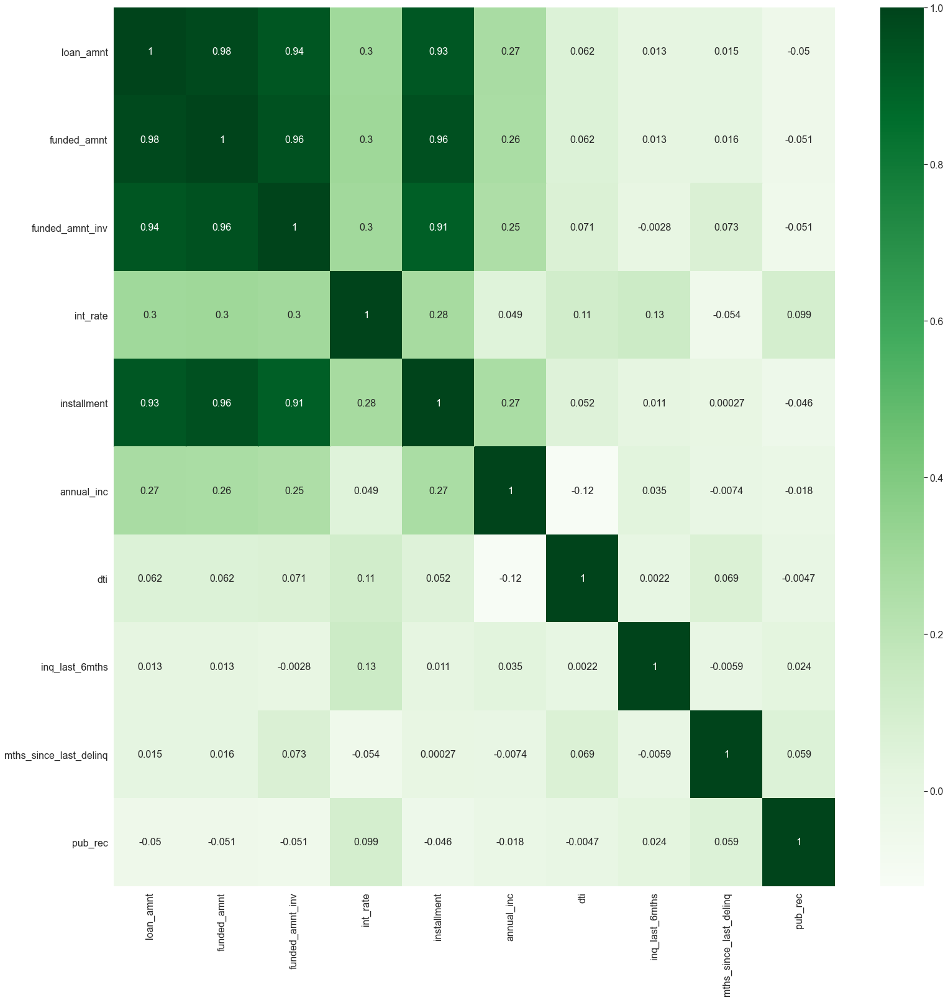

In [300]:
#Checking for correlation
plt.figure(figsize=(26, 26))
sns.heatmap(data.corr(), cmap='Greens', annot=True)

Looking at the correlation it is clear that <b>loan_amnt, funded_amnt, funded_amnt_inv</b> are highly correlated<br>
We can thus keep only 1 column so as to remove the extra redundency<br>
We chose to keep <b>loan_status</b> as it seems to be the most relevant and a good representative of the other 3 columns

In [301]:
print("Shape before removing the columns: {}".format(data.shape))
data.drop(['funded_amnt', 'funded_amnt_inv'], axis=1, inplace=True)
print("Shape after removing the columns: {}".format(data.shape))

Shape before removing the columns: (38577, 20)
Shape after removing the columns: (38577, 18)


In [302]:
data.columns

Index(['loan_amnt', 'term', 'int_rate', 'installment', 'grade', 'sub_grade',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'loan_status', 'purpose', 'addr_state', 'dti', 'inq_last_6mths',
       'mths_since_last_delinq', 'pub_rec', 'issue_month'],
      dtype='object')

In [303]:
data

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,addr_state,dti,inq_last_6mths,mths_since_last_delinq,pub_rec,issue_month
0,5000,36 months,0.1065,162.87,B,B2,10+ years,RENT,24000.0,Verified,Fully Paid,credit_card,AZ,27.65,1,NaN,0,12
1,2500,60 months,0.1527,59.83,C,C4,< 1 year,RENT,30000.0,Source Verified,Charged Off,car,GA,1.00,5,NaN,0,12
2,2400,36 months,0.1596,84.33,C,C5,10+ years,RENT,12252.0,Not Verified,Fully Paid,small_business,IL,8.72,2,NaN,0,12
3,10000,36 months,0.1349,339.31,C,C1,10+ years,RENT,49200.0,Source Verified,Fully Paid,other,CA,20.00,1,35.0,0,12
5,5000,36 months,0.0790,156.46,A,A4,3 years,RENT,36000.0,Source Verified,Fully Paid,wedding,AZ,11.20,3,NaN,0,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,2500,36 months,0.0807,78.42,A,A4,4 years,MORTGAGE,110000.0,Not Verified,Fully Paid,home_improvement,CO,11.33,0,0.0,0,7
39713,8500,36 months,0.1028,275.38,C,C1,3 years,RENT,18000.0,Not Verified,Fully Paid,credit_card,NC,6.40,1,5.0,0,7
39714,5000,36 months,0.0807,156.84,A,A4,< 1 year,MORTGAGE,100000.0,Not Verified,Fully Paid,debt_consolidation,MA,2.30,0,0.0,0,7
39715,5000,36 months,0.0743,155.38,A,A2,< 1 year,MORTGAGE,200000.0,Not Verified,Fully Paid,other,MD,3.72,0,0.0,0,7


## Binning of data

We can see a few columns that can be binned and could provide us with better insights are<br>
<b>loan_amnt, annual_inc, emp_length</b>

loan_amnt

In [304]:
print("Missing Value count: {}\nData type: {}".format(get_info('loan_amnt')[0], get_info('loan_amnt')[1]))

Missing Value count: 0
Data type: int64


In [305]:
# We are dividing the loan_amnt into 3 bins 
"""
  0%  - 33%  - Low
  33% - 66%  - Medium
  66% - 100% - High
"""
print([data.loan_amnt.quantile([.33, .66, 1.00])])

[0.33     6400.0
0.66    12000.0
1.00    35000.0
Name: loan_amnt, dtype: float64]


In [306]:
labels = ['Low', 'Medium', 'High']
data['loan_amnt_binned'] = pd.qcut(data['loan_amnt'], q=[0, .33, .66, 1], labels=labels)
print(data['loan_amnt_binned'].value_counts())

Medium    13010
High      12819
Low       12748
Name: loan_amnt_binned, dtype: int64


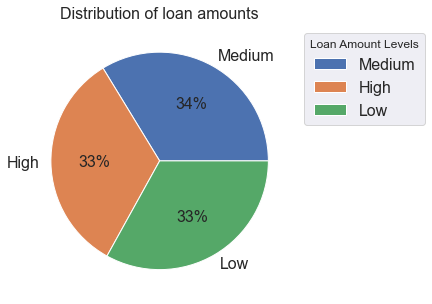

In [307]:
plt.figure(figsize=(7, 5))
data['loan_amnt_binned'].value_counts().plot(kind='pie', labels=data['loan_amnt_binned'].value_counts().keys(), autopct='%.0f%%')
plt.title('Distribution of loan amounts')
plt.ylabel('')
plt.legend(title='Loan Amount Levels', bbox_to_anchor=(1, 1))

annual_inc

In [308]:
print("Missing Value count: {}\nData type: {}".format(get_info('annual_inc', data)[0], get_info('annual_inc', data)[1]))

Missing Value count: 0
Data type: float64


In [309]:
# We are dividing the annual_inc into 3 bins 
"""
  0%  - 33%  - Low
  33% - 66%  - Medium
  66% - 100% - High
"""
[data.annual_inc.quantile([.33, .66, 1.00])]

[0.33      46000.0
 0.66      72000.0
 1.00    6000000.0
 Name: annual_inc, dtype: float64]

In [310]:
labels = ['Low', 'Medium', 'High']
data['annual_inc_binned'] = pd.qcut(data['annual_inc'], q=[0, .33, .66, 1], labels=labels)
print(data['annual_inc_binned'].value_counts())

Medium    12959
High      12812
Low       12806
Name: annual_inc_binned, dtype: int64


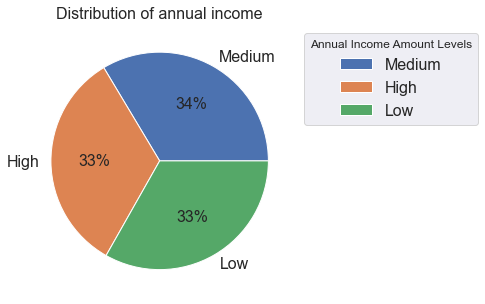

In [311]:
plt.figure(figsize=(7, 5))
data['annual_inc_binned'].value_counts().plot(kind='pie', labels=data['annual_inc_binned'].value_counts().keys(), autopct='%.0f%%')
plt.title('Distribution of annual income')
plt.ylabel('')
plt.legend(title='Annual Income Amount Levels', bbox_to_anchor=(1, 1))

emp_length

In [312]:
data['emp_length'].value_counts()

10+ years    8488
< 1 year     4508
2 years      4291
3 years      4012
4 years      3342
5 years      3194
1 year       3169
6 years      2168
7 years      1711
8 years      1435
9 years      1226
Name: emp_length, dtype: int64

We are dividing the annual_inc into these 4 bins<br>
0-3 years of experience<br>
3-5 years of experience<br>
5-10  years of experience<br>
10+  years of experience<br>

In [313]:
get_info('emp_length')

(1075, dtype('O'))

A total of 1033 missing values

In [314]:
#percentage of missing value
(get_info('emp_length')[0]/data.shape[0])*100

2.7866345231614695

There is 2.677% of missing data in emp_length<br><br>
As the percentage of missing values is very less we can go ahead and remove the records<br>
<u>But as we are binning the data</u>, we can deduce the bin they can be kept in<br>
To do this, we are taking annual income(annual_inc) as a parameter<br>
    <b>Step:</b>
    <ol>
        <li> Find which annual income bin does most of the missing emp length value is in.</li> 
        <li> Find, in that annual income bin which is the most common emp length range.</li>
    </ol>
    We can then make an calculated assumption, in which emp length bin these missing values can be kept in

<AxesSubplot:>

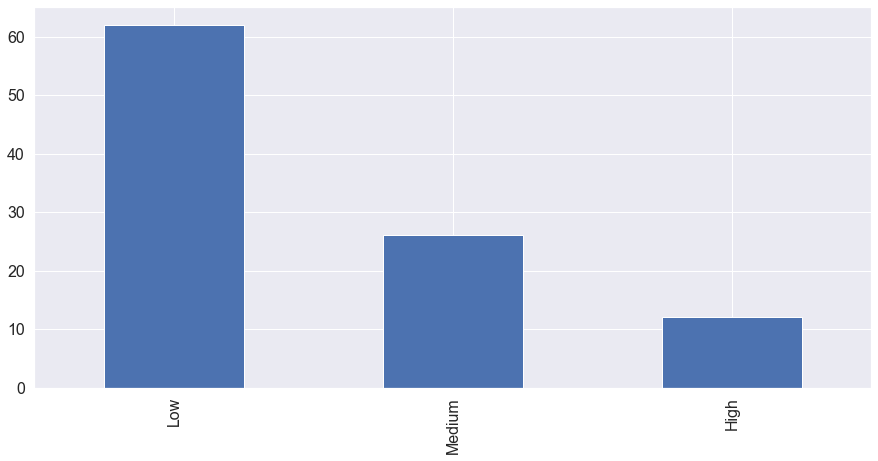

In [315]:
# Step 1
((data[data['emp_length'].isnull()]['annual_inc_binned'].value_counts()\
 /data[data['emp_length'].isnull()]['annual_inc_binned'].shape[0])\
    *100).plot(kind='bar', figsize=(15, 7))

We can see that most of the missing emp length values lie in <u><b>Low annual income</b></u> range 

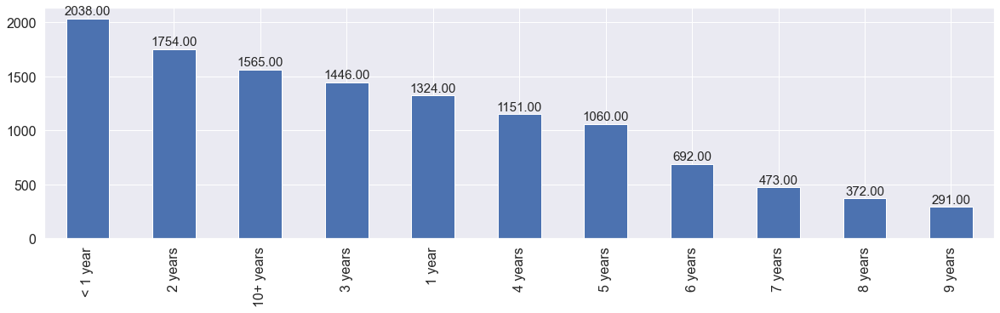

In [316]:
# Step 2
plt.figure(figsize=(20, 5))
plots = data[data['annual_inc_binned'] == 'Low']['emp_length'].value_counts().plot(kind='bar')
annot_bar_plot(plots)

With this it is evident that most of most of the Low annual income range is can be captured into <u><b>0-3 years of experience bin</b></u>

In [317]:
data['emp_length'] = data['emp_length'].apply(lambda x: x.replace('< ', '') if ('< ' in str(x)) 
  else( x.replace('+', '') if ('+' in str(x))
   else x))\
   .apply(lambda x: str(x).split(' ')[0])\
   .apply(lambda x: '0-3' if ((x=='nan') or (int(x)<3)) 
        else ( '3-5' if (int(x)>=3 and int(x)<5) 
              else ( '5-10' if (int(x)>=5 and int(x)<10) 
                    else '10+')))

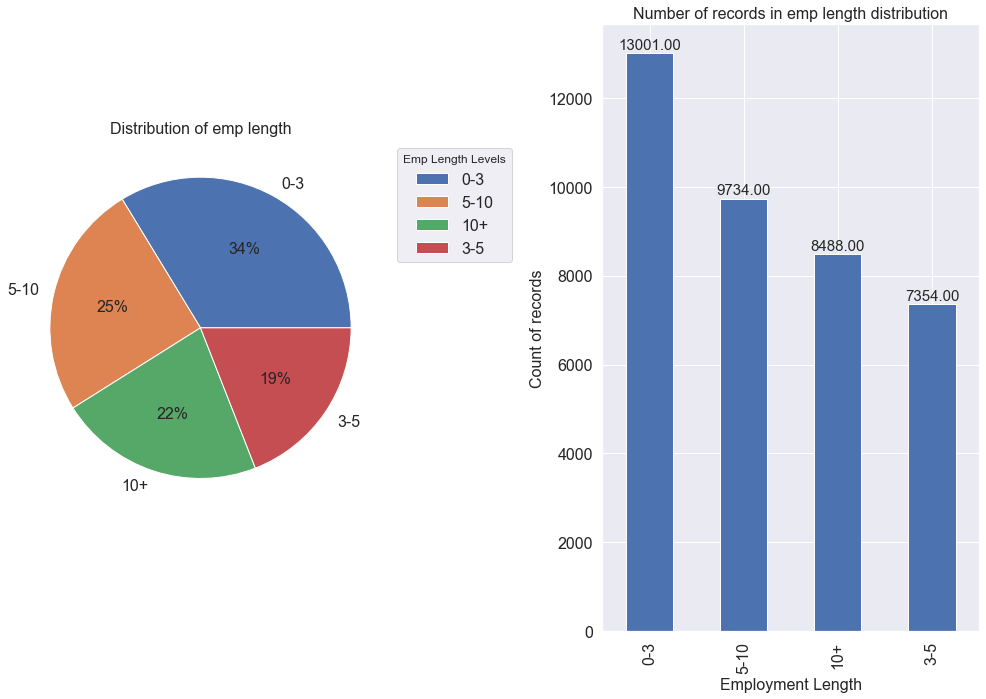

In [318]:
# Distribution after binning emp length
plt.figure(figsize=(14, 10))

plt.subplot(1, 2, 1)
data['emp_length'].value_counts().plot(kind='pie', labels=data['emp_length'].value_counts().keys(), autopct='%.0f%%')
plt.title('Distribution of emp length')
plt.ylabel('')
plt.legend(title='Emp Length Levels', bbox_to_anchor=(1, 1))

plt.subplot(1, 2, 2)
plots = data['emp_length'].value_counts().plot(kind='bar')
annot_bar_plot(plots)
plt.xlabel('Employment Length')
plt.ylabel('Count of records')
plt.title('Number of records in emp length distribution')
plt.tight_layout()

The highest number of records are in 0-3 years of experience<br>
And the the lowest are in 3-5 years of experience

Checking for missing values in all columns before we move forward

Text(0.5, 1.0, 'Percentage of missing values in the dataframe')

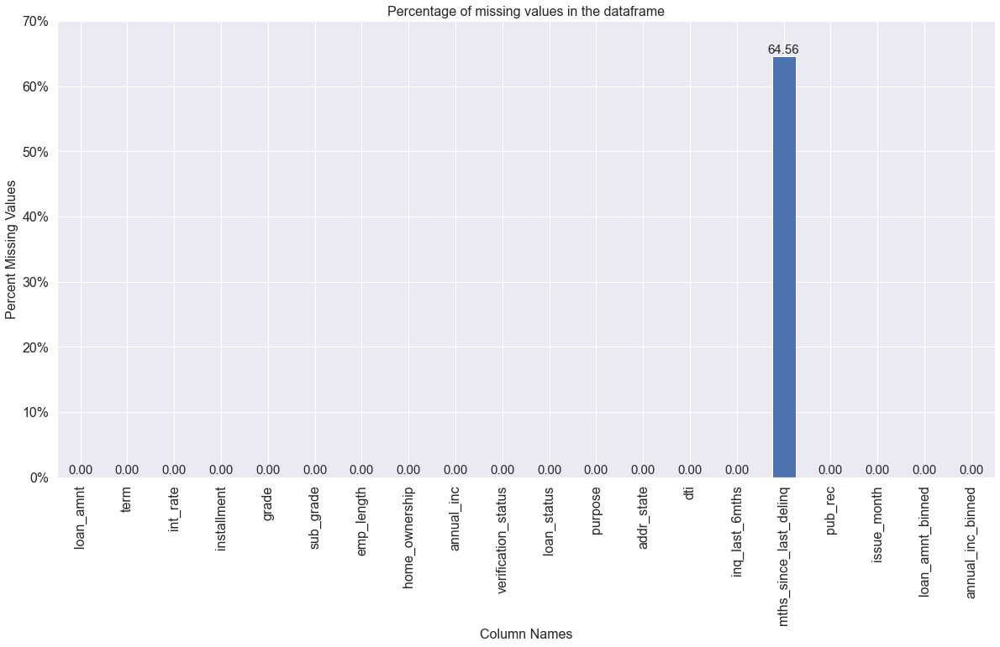

In [319]:
plt.figure(figsize=(20, 10))
plots = ((data.isnull().sum()/data.shape[0])*100).plot(kind='bar')
plt.yticks(ticks=plt.yticks()[0], labels=[str(int(x))+'%' for x in plt.yticks()[0]])

annot_bar_plot(plots)

plt.ylabel('Percent Missing Values')
plt.xlabel('Column Names')
plt.title('Percentage of missing values in the dataframe')

One column seems to have missing data<br>
<ol>
    <li>
        mths_since_last_delinq: 64.56%
    </li>
</ol>    

<b>mths_since_last_delinq</b>

In [322]:
data['mths_since_last_delinq'].value_counts()

0.0      443
15.0     244
23.0     243
30.0     243
24.0     236
        ... 
115.0      1
106.0      1
120.0      1
95.0       1
103.0      1
Name: mths_since_last_delinq, Length: 95, dtype: int64

In [323]:
data[data['mths_since_last_delinq'].isnull()]

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,addr_state,dti,inq_last_6mths,mths_since_last_delinq,pub_rec,issue_month,loan_amnt_binned,annual_inc_binned
0,5000,36 months,0.1065,162.87,B,B2,10+,RENT,24000.0,Verified,Fully Paid,credit_card,AZ,27.65,1,NaN,0,12,Low,Low
1,2500,60 months,0.1527,59.83,C,C4,0-3,RENT,30000.0,Source Verified,Charged Off,car,GA,1.00,5,NaN,0,12,Low,Low
2,2400,36 months,0.1596,84.33,C,C5,10+,RENT,12252.0,Not Verified,Fully Paid,small_business,IL,8.72,2,NaN,0,12,Low,Low
5,5000,36 months,0.0790,156.46,A,A4,3-5,RENT,36000.0,Source Verified,Fully Paid,wedding,AZ,11.20,3,NaN,0,12,Low,Low
6,7000,60 months,0.1596,170.08,C,C5,5-10,RENT,47004.0,Not Verified,Fully Paid,debt_consolidation,NC,23.51,1,NaN,0,12,Medium,Medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39650,5000,36 months,0.0743,155.38,A,A2,10+,MORTGAGE,65000.0,Not Verified,Fully Paid,other,MA,0.28,1,NaN,0,9,Low,Medium
39659,4000,36 months,0.0964,128.41,B,B4,0-3,NONE,100000.0,Not Verified,Fully Paid,other,CA,15.00,1,NaN,0,8,Low,High
39660,2800,36 months,0.0870,88.65,B,B1,0-3,NONE,120000.0,Not Verified,Fully Paid,other,MA,15.00,1,NaN,0,8,Low,High
39686,6400,36 months,0.0964,205.45,B,B4,0-3,RENT,60000.0,Not Verified,Fully Paid,moving,WI,7.72,0,NaN,0,8,Low,Medium


Following the similar steps mentioned above for emp_length missing values

<AxesSubplot:>

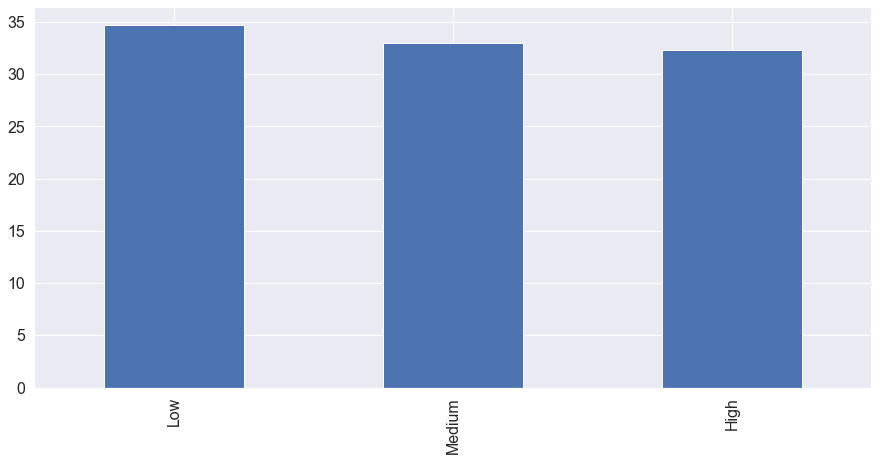

In [324]:
# Step 1
((data[data['mths_since_last_delinq'].isnull()]['annual_inc_binned'].value_counts()\
 /data[data['mths_since_last_delinq'].isnull()]['annual_inc_binned'].shape[0])\
    *100).plot(kind='bar', figsize=(15, 7))

In [325]:
# Step 2
data[data['annual_inc_binned'] == 'Low']['mths_since_last_delinq'].value_counts()[:4]/data[data['annual_inc_binned'] == 'Low']['mths_since_last_delinq'].shape[0]

0.0     0.014368
30.0    0.006716
39.0    0.006247
15.0    0.006169
22.0    0.006091
38.0    0.006091
24.0    0.006091
20.0    0.005935
35.0    0.005779
26.0    0.005622
23.0    0.005544
25.0    0.005544
31.0    0.005544
40.0    0.005466
37.0    0.005466
16.0    0.005388
19.0    0.005310
45.0    0.005154
18.0    0.005154
10.0    0.005076
32.0    0.004998
47.0    0.004920
34.0    0.004841
42.0    0.004841
17.0    0.004841
27.0    0.004763
41.0    0.004529
36.0    0.004451
29.0    0.004451
21.0    0.004451
48.0    0.004373
33.0    0.004295
46.0    0.004295
7.0     0.004217
44.0    0.004061
43.0    0.003983
14.0    0.003904
12.0    0.003904
63.0    0.003904
11.0    0.003748
6.0     0.003748
56.0    0.003670
4.0     0.003592
Name: mths_since_last_delinq, dtype: float64

As there is a huge percentage of missing values and no obvious way to impute as we can see, we can just drop the column

In [326]:
print("Shape before removing the columns: {}".format(data.shape))
data.drop(['mths_since_last_delinq'], axis=1, inplace=True)
print("Shape after removing the columns: {}".format(data.shape))

Shape before removing the columns: (38577, 20)
Shape after removing the columns: (38577, 19)


Text(0.5, 1.0, 'Percentage of missing values in the dataframe')

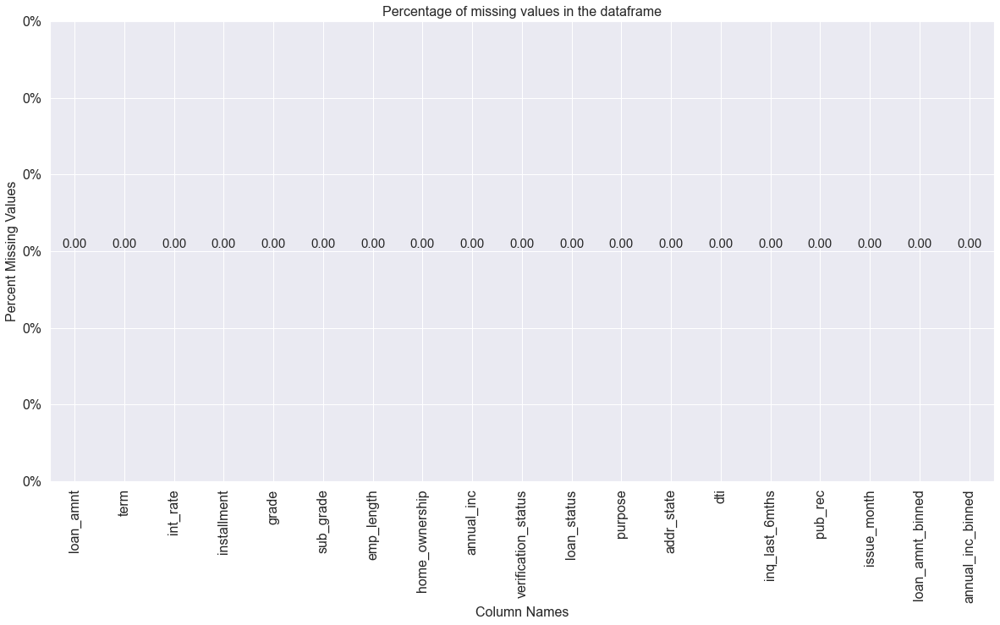

In [327]:
# Once Again measure the missing values
plt.figure(figsize=(20, 10))
plots = ((data.isnull().sum()/data.shape[0])*100).plot(kind='bar')
plt.yticks(ticks=plt.yticks()[0], labels=[str(int(x))+'%' for x in plt.yticks()[0]])

for bar in plots.patches:
    plots.annotate(format(bar.get_height(), '.2f'),
                       (bar.get_x() + bar.get_width() / 2,
                        bar.get_height()), ha='center', va='center',
                       size=15, xytext=(0, 8),
                       textcoords='offset points')

plt.ylabel('Percent Missing Values')
plt.xlabel('Column Names')
plt.title('Percentage of missing values in the dataframe')

Data Information at this point
<ol>
    <li>Number of records: <b>38577</b><br>Number of columns: <b>20</b></li>
    <li>No missing values in columns</li>
</ol>

# UVA

For UVA we would first be seperating out the categorical and quantitative columns<br>
We will also be creating functions for plotting the graphs<br>
Also we would try to extract information from the graphs

In [328]:
#list of all the columns in the dataframe
list_of_columns = list(data.columns)
print("List of columns:\n{}".format(list_of_columns))

#Total number of columns
print("\nNumber of columns: {}".format(len(list_of_columns)))

List of columns:
['loan_amnt', 'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_length', 'home_ownership', 'annual_inc', 'verification_status', 'loan_status', 'purpose', 'addr_state', 'dti', 'inq_last_6mths', 'pub_rec', 'issue_month', 'loan_amnt_binned', 'annual_inc_binned']

Number of columns: 19


<u>Seperating out</u> the Categorical and quantitative variables

In [329]:
get_all_types(data)

{'loan_amnt': dtype('int64'),
 'term': dtype('O'),
 'int_rate': dtype('float64'),
 'installment': dtype('float64'),
 'grade': dtype('O'),
 'sub_grade': dtype('O'),
 'emp_length': dtype('O'),
 'home_ownership': dtype('O'),
 'annual_inc': dtype('float64'),
 'verification_status': dtype('O'),
 'loan_status': dtype('O'),
 'purpose': dtype('O'),
 'addr_state': dtype('O'),
 'dti': dtype('float64'),
 'inq_last_6mths': dtype('int64'),
 'pub_rec': dtype('int64'),
 'issue_month': dtype('O'),
 'loan_amnt_binned': CategoricalDtype(categories=['Low', 'Medium', 'High'], ordered=True),
 'annual_inc_binned': CategoricalDtype(categories=['Low', 'Medium', 'High'], ordered=True)}

In [330]:
categorical_vars = []
quantitative_vars = []
for i in list_of_columns:
    if (data[i].dtype == 'int64') or (data[i].dtype == 'float64'):
        quantitative_vars.append(i)
    else:
        categorical_vars.append(i)
print("Categorical variable are: \n {}\n The Number of Categorical Variables: {}".format(categorical_vars,len(categorical_vars)))
print("Quantitative variable are: \n {}\n The Number of Quantitative Variables: {}".format(quantitative_vars,len(quantitative_vars)))

Categorical variable are: 
 ['term', 'grade', 'sub_grade', 'emp_length', 'home_ownership', 'verification_status', 'loan_status', 'purpose', 'addr_state', 'issue_month', 'loan_amnt_binned', 'annual_inc_binned']
 The Number of Categorical Variables: 12
Quantitative variable are: 
 ['loan_amnt', 'int_rate', 'installment', 'annual_inc', 'dti', 'inq_last_6mths', 'pub_rec']
 The Number of Quantitative Variables: 7


### Functions for plotting for UVA

In [353]:
def plot_categorical(vars, data=data):
    plt.figure(figsize=(20,63),facecolor='grey')
    sns.set_style("dark")
    sns.set(color_codes=True)
    
    rows = len(vars)
    for i in range(len(vars)):
        plt.subplot(rows, 2, (2*i)+1)
        sns.countplot(vars[i], data=data, order = data[vars[i]].value_counts().index)
        plt.title(str(vars[i]), fontsize=14, color='w')
        plt.xlabel(str(vars[i])+' Values', fontsize=14, color='w')
        plt.ylabel('Count', fontsize=14, color='w')
        plt.xticks(rotation=45, fontsize=14, color='w')
        plt.yticks(rotation=45, fontsize=14, color='w')
        
        if (vars[i] not in ['sub_grade', 'addr_state', 'purpose']): #pie chart is not very useful visually when there are more categories
            plt.subplot(rows, 2, (2*i)+2)
            data[vars[i]].value_counts().plot(kind='pie', autopct='%.0f%%')
            plt.title('Distribution of ' + str(vars[i]), fontsize=14, color='w')
            plt.ylabel('')
            plt.legend(title=vars[i], bbox_to_anchor=(1, 1))
    plt.subplots_adjust(hspace=0.5)
#     plt.tight_layout()

def plot_quantitative(vars, data=data):
    plt.figure(figsize=(21,28),facecolor='grey')
    sns.set_style("dark")
    sns.set(color_codes=True)
    
    rows = math.ceil(len(vars)/2)
    for i in range(len(vars)):
        plt.subplot(rows, 2, i+1)
        sns.distplot(data[vars[i]], rug = True)        
        plt.title(str(vars[i]), fontsize=14, color='w')
        plt.xlabel(str(vars[i])+' Values', fontsize=14, color='w')
        plt.ylabel('Distribution', fontsize=14, color='w')
        plt.xticks(rotation=45, fontsize=14, color='w')
        plt.yticks(rotation=45, fontsize=14, color='w')
    plt.subplots_adjust(hspace=0.5)

#### Plotting the Categorical Variables

In [335]:
print("Categorical variable are: \n {}\n\n The Number of Categorical Variables: {}".format(categorical_vars,len(categorical_vars)))

Categorical variable are: 
 ['term', 'grade', 'sub_grade', 'emp_length', 'home_ownership', 'verification_status', 'loan_status', 'purpose', 'addr_state', 'issue_month', 'loan_amnt_binned', 'annual_inc_binned']

 The Number of Categorical Variables: 12


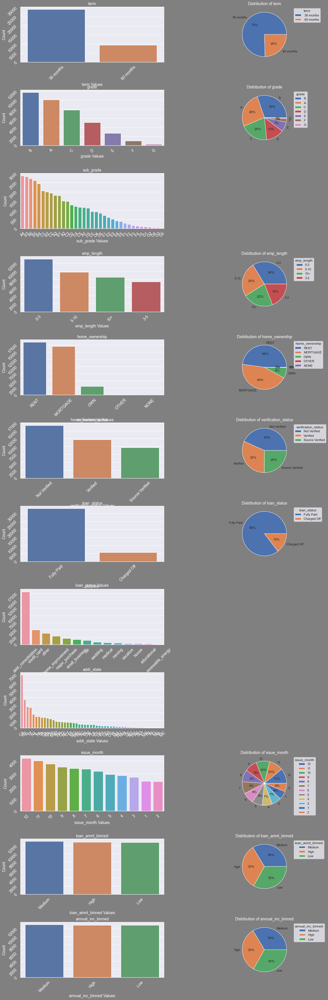

In [336]:
plot_categorical(categorical_vars)

Variable: <b>Term</b>
<br><u>Observations</u>:
<br>In total there are two loan terms, 36 and 60 months.
<br>75% of the borowers opted for 36 Months(shorter period term)
<br><u>Analysis</u>:
<br>Psychological Reasons: Borowers want to finish up their debts faster
<br>Most of the loans could be of smaller amounts so small term seems to be a better option

Variable: <b>grade</b>
<br><u>Observations</u>:
<br>Grade A has 30% of the loans taken
<br>Grade G only has 1%
<br>Grade A, B and C almost 76% of the loans taken
<br>There is a gradual decline from grade C to G
<br><u>Analysis</u>:
<br>The trend from grade C to G might be because, as the grade decreases the risk might be increasing so there may be more rejection of loan applications. 
<br>Grade A is lacking behind B in terms of approved loans, this can be due to the sheer number of applications for loan that could fall in grade B are more than that of A

Variable: <b>sub_grade</b>
<br><u>Observations</u>:
<br>Most of the loans were taken by people from sub-grades like A4,B3,A5,B5,C1,B2 and C2.
<br><u>Analysis</u>:
<br>The Reasons are similar to grade variable

Variable: <b>emp_length</b>
<br><u>Observations</u>:
<br>0-3 YOE has the highest(34%) of total loans taken, and 3-5 YOE has the lowest(19%).
<br><u>Analysis</u>:
<br>The reason for high number of loans for 0-3 YOE, may be because of their financial stance is not stable and clear.
<br>The reason for 3-5 YOE number of loans being lowest, might be due higher income but lower lower responsibilities.

Variable: <b>home_ownership</b>
<br><u>Observations</u>:
<br>Most ofthe borrowers live on RENT(48%) and few of them actually own a house(8%)
<br><u>Analysis</u>:
<br>Maybe due to expenses in rent, there might be a need for loan in other areas.
<br>A chunck of these loans can be for a house loan.
<br>People with house will probably is missing the house loan count.

Variable: <b>verification_status</b>
<br><u>Observations</u>:
<br>43% of the loans approved were not verified(which should be taken care of to avoid any future consequences).
<br>31% of the loans approved were verified.
<br>25% of the loans approved were source verified.
<br><u>Analysis</u>:
<br>Maybe this high percentage of unverified approvals are because of targets of the loan marketplace/investors.

Variable: <b>loan_status</b>
<br><u>Observations</u>:
<br>85% of the borrowers paid off their loans
<br>15% of them have defaulted(have charged off loans).
<br><u>Analysis</u>: This is our target variable

Variable: <b>purpose</b>
<br><u>Observations</u>:
<br>Most of the loans were taken for the purpose of debt consolidation and credit card payments, while debt consolidation forms the major chunk.
<br>Loans taken for reneawable energy is very less.
<br><u>Analysis</u>:
<br>reneawable energy is a new technology and might not have a lot of loan applications applied for it yet.
<br>Psychological reason: debt consolidation allows them to have only one loan that they can care for.
<br>Number of loans taken for home are less compared to other types of loans as its a life time event.

Variable: <b>addr_state</b>
<br><u>Observations</u>:
<br>Most of the loans were take from states like CA and NY.
<br><u>Analysis</u>:
<br>For CA there is a huge spike may be because of startups.

Variable: <b>issue_month</b>
<br><u>Observations</u>:
<br>Most of the loans were taken up in the month of DEC
<br><u>Analysis</u>:
<br>People are planning ahead for the next year, may be because of that they are taking loans just before the year starts
<br>The loans were taken more at the end of year becuase of vacations

Variable: <b>loan_amnt_binned</b>
Variable: <b>annual_inc_binned</b>
We have binned these for ~33% in each bin


Before moving to quantitative analysis, lets first

## Removing outliers

Text(0.5, 1.0, 'Box Plot')

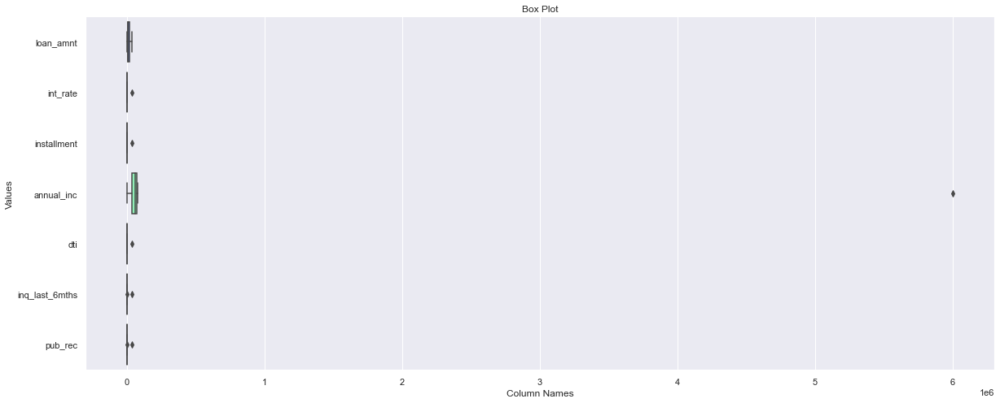

In [338]:
plt.figure(figsize=(20, 8))
sns.boxplot(data=data.describe(), orient='h', palette='rainbow')
plt.ylabel('Values')
plt.xlabel('Column Names')
plt.title('Box Plot')

Looking at the plot above it is clear, <b>annual_inc</b> has outliers<br>
So let's remove the outliers in it

In [339]:
#Looking at spread of the variable
data.annual_inc.quantile([.70, .80, .90, .92, .95, .96, .97, .98, 0.99, 1.00])

0.70      75000.0
0.80      90000.0
0.90     115000.0
0.92     122000.0
0.95     140004.0
0.96     150000.0
0.97     165000.0
0.98     187000.0
0.99     234144.0
1.00    6000000.0
Name: annual_inc, dtype: float64

In [340]:
#Looking at summary
data.annual_inc.describe()

count    3.857700e+04
mean     6.877797e+04
std      6.421868e+04
min      4.000000e+03
25%      4.000000e+04
50%      5.886800e+04
75%      8.200000e+04
max      6.000000e+06
Name: annual_inc, dtype: float64

In [341]:
# Taking the iq distance acceptable outliers method
# NOTE: we do not need below range as we can see clearly all the outliers seems to be on upper range side
Q1,Q3 = np.percentile(data.annual_inc , [25,75])
IQR = abs(Q3-Q1)

annual_inc_abv_range = Q3+(1.5*IQR)
print(annual_inc_abv_range)

145000.0


Remove the outliers from annual_inc > 145000

Shape before removing the records: (38577, 19)
Shape after removing the records: (36754, 19)


<AxesSubplot:>

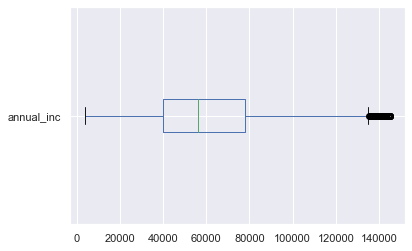

In [342]:
print("Shape before removing the records: {}".format(data.shape))
data = data[data.annual_inc<annual_inc_abv_range]
print("Shape after removing the records: {}".format(data.shape))
data.annual_inc.plot(kind='box', vert=False)

(array([-20000.,      0.,  20000.,  40000.,  60000.,  80000., 100000.,
        120000., 140000., 160000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

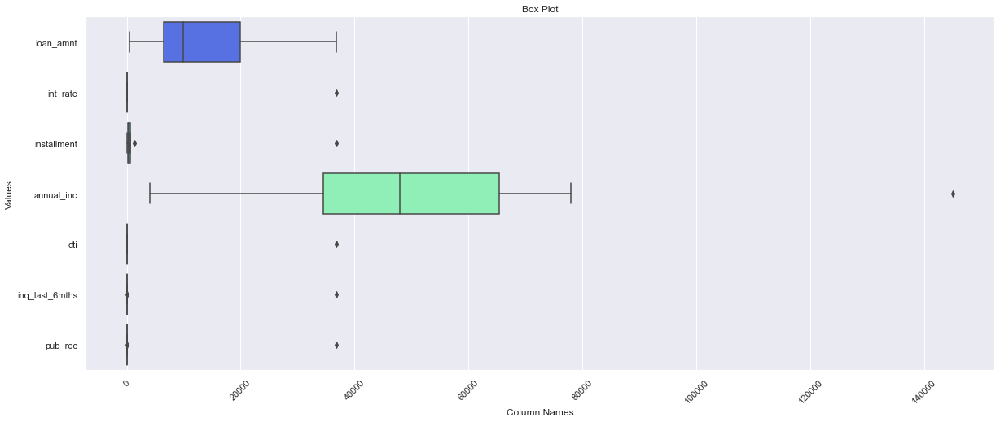

In [343]:
#Plotting the boxplot for data again
plt.figure(figsize=(20, 8))
sns.boxplot(data=data.describe(), orient='h', palette='rainbow')
plt.ylabel('Values')
plt.xlabel('Column Names')
plt.title('Box Plot')
plt.xticks(rotation=45)

<b>loan_amnt</b>

Lets find the outlier cutoff

In [345]:
# Taking the iq distance acceptable outliers
# do not need below range as we can see clearly all the outliers seems to be on upper range side
Q1,Q3 = np.percentile(data.loan_amnt , [25,75])
IQR = abs(Q3-Q1)

loan_amnt_abv_range = Q3+(1.5*IQR)
# blw_range = Q1-(1.5*IQR)

print(loan_amnt_abv_range)

30000.0


Removing values from loan_amnt>30000

Shape before removing the records: (36754, 19)
Shape after removing the records: (35943, 19)


<AxesSubplot:>

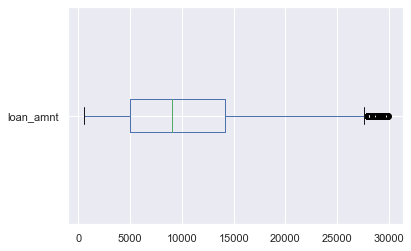

In [346]:
print("Shape before removing the records: {}".format(data.shape))
data = data[data.loan_amnt<loan_amnt_abv_range]
print("Shape after removing the records: {}".format(data.shape))
data.loan_amnt.plot(kind='box', vert=False)

(array([-20000.,      0.,  20000.,  40000.,  60000.,  80000., 100000.,
        120000., 140000., 160000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

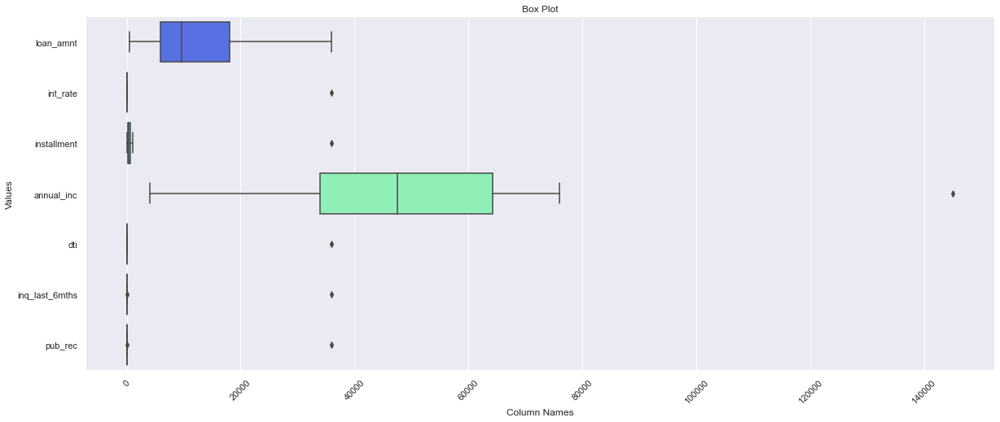

In [347]:
#Plotting the boxplot for data again
plt.figure(figsize=(20, 8))
sns.boxplot(data=data.describe(), orient='h', palette='rainbow')
plt.ylabel('Values')
plt.xlabel('Column Names')
plt.title('Box Plot')
plt.xticks(rotation=45)

For all the other columns there is no need to remove the outliers as they might be providing valuable information for our analysis

Resetting the index to have consistency maintained<br>
Looking at data

In [348]:
data.reset_index(drop=True, inplace=True)
data

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,loan_status,purpose,addr_state,dti,inq_last_6mths,pub_rec,issue_month,loan_amnt_binned,annual_inc_binned
0,5000,36 months,0.1065,162.87,B,B2,10+,RENT,24000.0,Verified,Fully Paid,credit_card,AZ,27.65,1,0,12,Low,Low
1,2500,60 months,0.1527,59.83,C,C4,0-3,RENT,30000.0,Source Verified,Charged Off,car,GA,1.00,5,0,12,Low,Low
2,2400,36 months,0.1596,84.33,C,C5,10+,RENT,12252.0,Not Verified,Fully Paid,small_business,IL,8.72,2,0,12,Low,Low
3,10000,36 months,0.1349,339.31,C,C1,10+,RENT,49200.0,Source Verified,Fully Paid,other,CA,20.00,1,0,12,Medium,Medium
4,5000,36 months,0.0790,156.46,A,A4,3-5,RENT,36000.0,Source Verified,Fully Paid,wedding,AZ,11.20,3,0,12,Low,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35938,5000,36 months,0.0870,158.30,B,B1,5-10,MORTGAGE,75000.0,Not Verified,Fully Paid,credit_card,CO,15.55,0,0,7,Low,High
35939,2500,36 months,0.0807,78.42,A,A4,3-5,MORTGAGE,110000.0,Not Verified,Fully Paid,home_improvement,CO,11.33,0,0,7,Low,High
35940,8500,36 months,0.1028,275.38,C,C1,3-5,RENT,18000.0,Not Verified,Fully Paid,credit_card,NC,6.40,1,0,7,Medium,Low
35941,5000,36 months,0.0807,156.84,A,A4,0-3,MORTGAGE,100000.0,Not Verified,Fully Paid,debt_consolidation,MA,2.30,0,0,7,Low,High


#### Plotting the Quantitative Variables

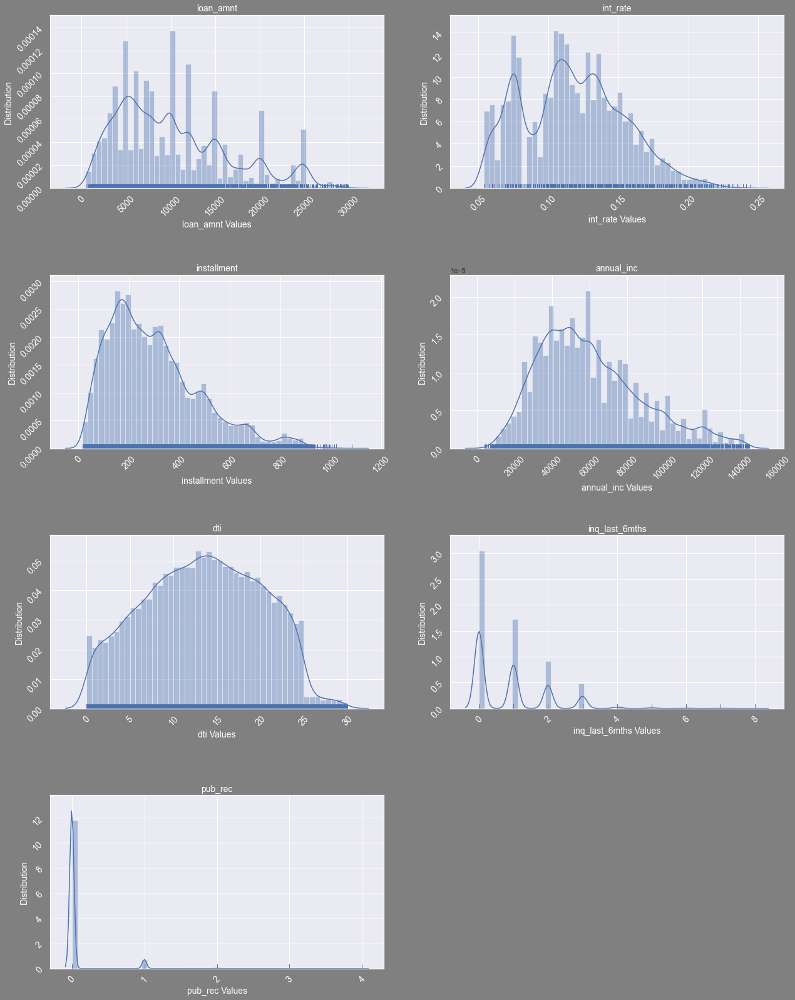

In [354]:
plot_quantitative(quantitative_vars)

### OBSERVATIONS
#### loan_amnt
    1. most loans are in 0-12k range
    2. Most loans are in rounded up figures 5k, 10k, 15k...
<br><u>Analysis</u>:
<br>Psychological reasons: Humans usually like erounded up values and more confortable with them.
<br>Maybe as the loans are more individual based and not some bigger firms etc, or might have taken as a suppliment to their current income to mean their needs, they are comfortable in 0-12k zone. 
#### int_rate
    1. most frequent nt rate is in 10-15% range
    2. after 15% it starts decreasing with very few opting for int rate >20%
    3. There is a steap drop at arund 10% interest rate zone.
<br><u>Analysis</u>:
<br>The drop near 10% might be because of nominal interest rates falling in around 7% rate zone follwed by most banks etc.
<br>Most personal loans are between 10-15%, maybe this data represents this category, so there is huge spread of loans taken here.
<br> rate above 20% might not be very attractive to most people, that could explain the fall around 20% and above.
#### installments
    1. mostly opting for installments in 100-300 range.
    2. steep decline after 600 with only a few after around >700 range
<br><u>Analysis</u>:
<br>100-300 is a more confortable range for installments, as its a montly payment.
<br>This could be due to maybe, fewer loans being high amount - low time period.

#### annual_inc
    1. 30000 - 65000 most salary range
<br><u>Analysis</u>:
<br>It could to be the average market value of salary of individuals, that could be a larger part of our data.

#### dti
    1. most value lie in 10-20 range 
<br><u>Analysis</u>:
<br>It could to be the average distribution for individuals, that could be a larger part of our data.

#### inq_6_mnths
    1. very few have above 2 inquiries in past 6 mnths
    2. No inquiries seems to have the highest distribution.
<br><u>Analysis</u>:
<br>Its is always more likely for a person to get the loan if he has less inquires.

#### pub_rec
    1. mostly people with no derogatory public records are considered
    2. 1 record in a few cases
<br><u>Analysis</u>: 
<br>Its is always more likely for a person to get the loan if he has less derogatory public records.
    

### Bivariate Analysis

In [356]:
print('categorical_vars : {}'.format(categorical_vars))
print()
print('quantitative_vars : {}'.format(quantitative_vars))

categorical_vars : ['term', 'grade', 'sub_grade', 'emp_length', 'home_ownership', 'verification_status', 'loan_status', 'purpose', 'addr_state', 'issue_month', 'loan_amnt_binned', 'annual_inc_binned']

quantitative_vars : ['loan_amnt', 'int_rate', 'installment', 'annual_inc', 'dti', 'inq_last_6mths', 'pub_rec']


<AxesSubplot:>

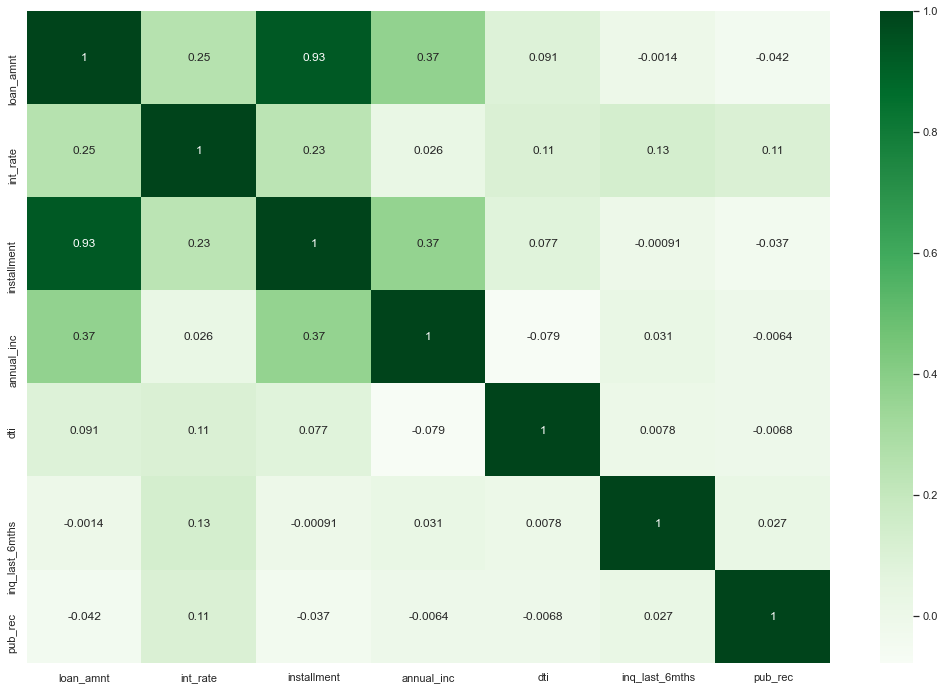

In [357]:
#Checking for correlation
plt.figure(figsize=(18, 12))
sns.heatmap(data.corr(), cmap='Greens', annot=True)

Positive correlation

<AxesSubplot:>

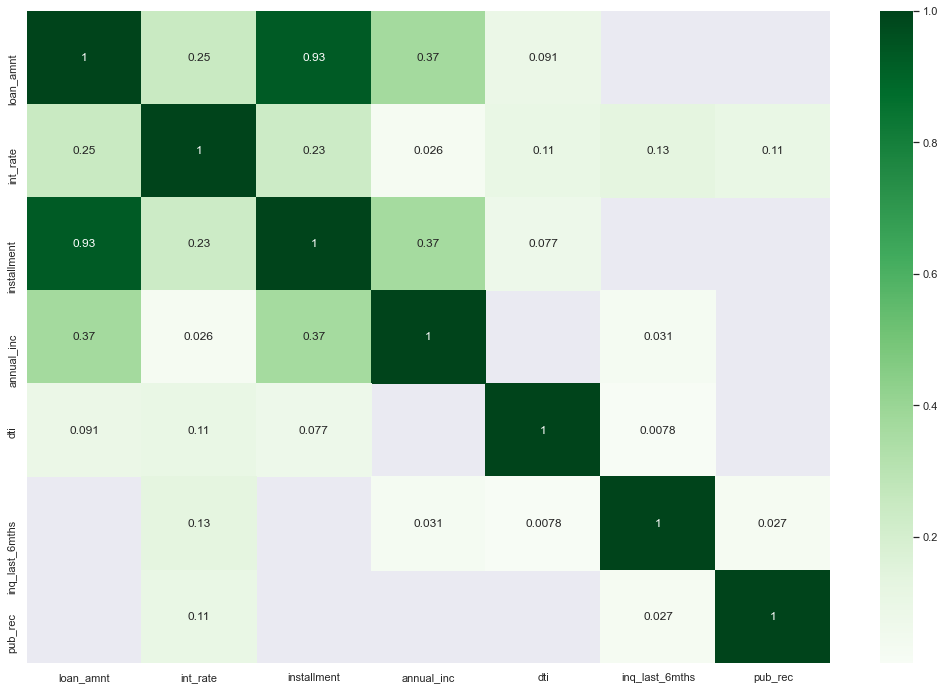

In [360]:
plt.figure(figsize=(18, 12))
sns.heatmap(data.corr()[data.corr() > 0], cmap='Greens', annot=True)

Negative Correlation

<AxesSubplot:>

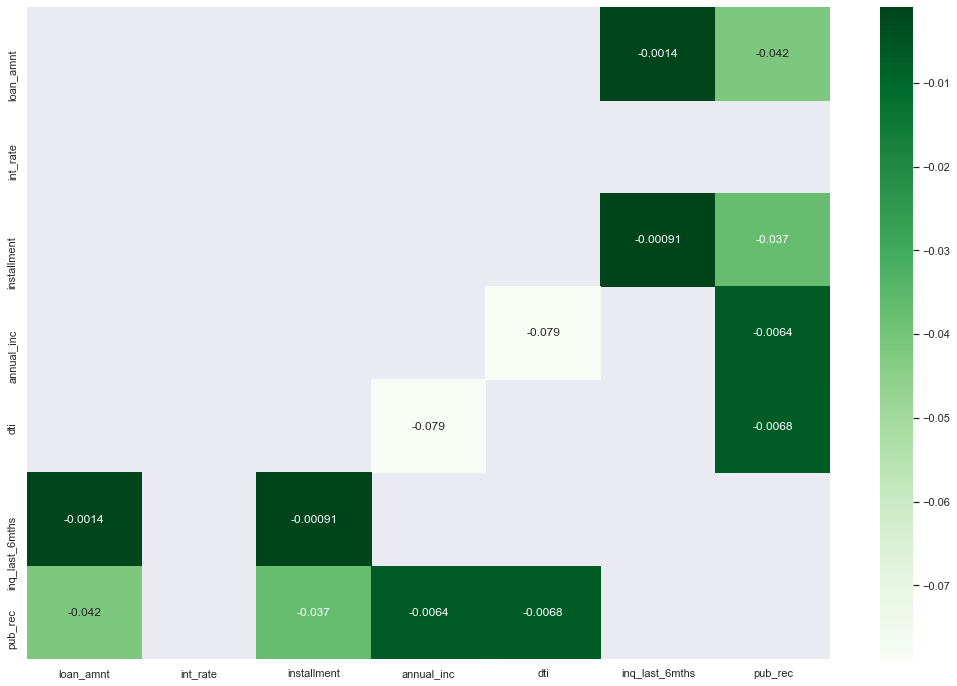

In [361]:
plt.figure(figsize=(18, 12))
sns.heatmap(data.corr()[data.corr() < 0], cmap='Greens', annot=True)

Correlation matrix analysis of <b>loan_amnt</b>

Variable: <b>loan_amnt</b>
<br><u>Observations</u>:
<br>installments: have 93% correlation, as expected.
<br>int_rate: have 25% correlation with it.
<br>annual_inc: have 37% correlation.
<br>inq_last_6mths: negativily correlated
<br>pub_rec: negativily correlated
<br><u>Analysis</u>:
<br>installments: are as expected highly correlated with it.
<br>int_rate: int rate also depends on risk as well as term, thats why its at only 25%.
<br>annual_inc: As more income he can afford higher loans - its only at 37% maybe becuse loan_amnt depends on many other factors.
<br>inq_last_6mths and pub_rec: as they increase there is a lesser chance of getting loans.

In [362]:
print("Categorical variable are: \n {}\n The Number of Categorical Variables: {}".format(categorical_vars,len(categorical_vars)))
print("Quantitative variable are: \n {}\n The Number of Quantitative Variables: {}".format(quantitative_vars,len(quantitative_vars)))

Categorical variable are: 
 ['term', 'grade', 'sub_grade', 'emp_length', 'home_ownership', 'verification_status', 'loan_status', 'purpose', 'addr_state', 'issue_month', 'loan_amnt_binned', 'annual_inc_binned']
 The Number of Categorical Variables: 12
Quantitative variable are: 
 ['loan_amnt', 'int_rate', 'installment', 'annual_inc', 'dti', 'inq_last_6mths', 'pub_rec']
 The Number of Quantitative Variables: 7


Making combinations of variables

In [478]:
# quantitave - categorical
quan_cat = [['loan_amnt', 'term'], ['loan_amnt', 'grade'],
                ['loan_amnt', 'verification_status'], ['loan_amnt', 'purpose'],
            ['int_rate', 'grade'],
                ['int_rate', 'purpose'], ['int_rate', 'addr_state'],
            ['annual_inc', 'grade'], ['annual_inc', 'loan_amnt_binned'], ['annual_inc', 'addr_state'],
            ['dti', 'grade'], ['dti', 'purpose'], ['inq_last_6mths', 'purpose'],
            ['pub_rec', 'purpose']]

# categorical - categorical
cat_cat = [['grade', 'emp_length'],
          ['purpose', 'verification_status'], 
          ['grade', 'verification_status']]

# quantitave - quantitave
quan_quan = [['loan_amnt', 'int_rate'], ['loan_amnt', 'annual_inc'], ['loan_amnt', 'dti'],
             ['annual_inc', 'int_rate'], ['annual_inc', 'dti'],
            ['dti', 'inq_last_6mths']]

In [371]:
#for getting counts
data['index'] = range(1, len(data) + 1)

In [372]:
temp_categorical = [x for x in categorical_vars if x!='loan_status']
loan_status_with_cat = [[x, y] for x, y in zip(temp_categorical, ['loan_status']*len(temp_categorical))]

### Functions for BVA Plots

In [485]:
def plot_quan_cat(vars, data=data):
    sns.set_style("dark")
    sns.set(color_codes=True)
    
    set_plot_stats(30, 30, 30)
    
    rows = len(vars)
    plt.figure(figsize=(56, 25*rows))

    for i in range(len(vars)):        
        plt.subplot(rows, 3, (3*i)+1)
        plots = sns.barplot(data=data, x=vars[i][1], y=vars[i][0])
        plt.xticks(rotation=45)
        plt.yticks(rotation=45)
        
        plt.subplot(rows, 3, (3*i)+2)
        ax = sns.boxplot(x=vars[i][0], y=vars[i][1], data=data, orient='h')
        plt.xticks(rotation=45)
        
        plt.subplot(rows, 3, (3*i)+3)
        sns.pointplot(x=vars[i][1], y=vars[i][0], data =data,palette='rainbow')        
        plt.xticks(rotation=45)
        plt.yticks(rotation=45)
    
#     plt.subplots_adjust(wspace=0.2, hspace=0.5)
    plt.tight_layout()

def plot_cat_cat(vars, data=data):
    sns.set_style("dark")
    sns.set(color_codes=True)
    
#     set_plot_stats(40, 60, 80)
    
    rows = len(vars)
    fig, ax = plt.subplots(rows, 2, figsize=(14,56))

    for i in range(len(vars)):
        sns.heatmap(data=pd.pivot_table(data=data, columns=vars[i][0], index=vars[i][1], values='index', aggfunc='count'), ax=ax[i][0])

        crosstb = pd.crosstab(data[vars[i][0]], data[vars[i][1]]) 
        barplot = crosstb.plot.bar(ax=ax[i][1])
        barplot.legend(title=vars[i][1], bbox_to_anchor=(1, 1.02),
                 loc='upper left')
#     plt.subplots_adjust(wspace=0.2, hspace=0.5)    
    plt.tight_layout()
    
def plot_quan_quan(vars, data=data):
    sns.set_style("dark")
    sns.set(color_codes=True)
    
    set_plot_stats(40, 60, 80)
    
    rows = len(vars)
    plt.figure(figsize=(56, 10*rows))
    for i in range(len(vars)):
#         plt.figure(figsize=(56,120))
        
        plt.subplot(rows, 2, (2*i)+1)
        sns.scatterplot(data=data, x=vars[i][0], y=quan_quan[i][1])  
        plt.subplot(rows, 2, (2*i)+2)
        sns.lineplot(data=data, x=quan_quan[i][0], y=quan_quan[i][1])    
#         plt.subplot(rows, 3, (3*i)+3)
#         sns.barplot(data=data, x=quan_quan[i][0], y=quan_quan[i][1])
#         ax.set_title(str(vars[i]), fontsize=14, color='w')
        plt.xticks(rotation=90)
        
    plt.subplots_adjust(wspace=0.2, hspace=0.5)

# Quantitative vs Categorical Plots

In [367]:
plot_quan_cat(quan_cat)

Variables: <b>['loan_amnt', 'term']</b>
<br><u>Observations</u>:
<br>Higher loan amounts are in term of 60 months
<br>Loan amount distribution spread is much wider in 60 months term, on the other hand the distribution spread for 36 months term is much narrower
<br>a loan amount that is > mean of 36 month term is also taken by few borrowers in 60 month term, but the loan amount falls short of mean of 60 month term. 
<br><u>Analysis</u>:
<br>60 month term is easier to pay back the loan amount thus it makes sense to have a higher amount in it.
<br>the intersection of the  loan amounts, could be possible due to some borrowers being bale to pay much faster maybe due to higher income or lower interest rate

<br>Variables: <b>['loan_amnt', 'grade']</b>
<br><u>Observations</u>:
<br> There is a genearl trend , as the grade decreases from A to G - the maximum loan amount amount increases
<br> A basically has a narrow speard of loan amount and on the other hand riskier grades has a wider distribution speard.
<br><u>Analysis</u>:
<br> This might be because borrowers from G might be taking the loan for the purpose of funding a firm
<br> As there are few people who might get the grade A, so the amount that they might ask for is similar in most of the cases and borrowers who are categorized as G might vary a lot


<br>Variables: <b>['loan_amnt', 'verification_status']</b>
<br><u>Observations</u>:
<br> People who are verified has received higher amount of loans.
<br> Verified borrowers has a wide speard of loan amount distriburtion
<br><u>Analysis</u>:
<br> If a person is verified, then the investors are more comforrable in providing the loans

<br>Variables: <b>['loan_amnt', 'purpose']</b>
<br><u>Observations</u>: 
<br> The highest loan amounts were given for small businesses, debt consolidation, credit card payments and house, these also have the wider spread with respect to loan amount
<br>The least loan amounts were given in case of vacations and moving
<br><u>Analysis</u>:
<br> All of the things stated above, can be because of wider range of borrower in the same category .i.e creadit card payments can vary a lot depending on the individual

<br>Variables: <b>['int_rate', 'grade']</b>
<br><u>Observations</u>:
<br> As the grade goes from A to G, the interest rates goes up
<br><u>Analysis</u>:
<br>People from D, E, F and G are willing to take loans with more interest rates than their counter parts, which might be an indicator that they have no other option
or they have complications/obligations while applying  for loans and getting them approved so they don't bother about interest rates much.

<br>Variables: <b>['int_rate', 'purpose']</b>
<br><u>Observations</u>:
<br> The highest interest is for business and debt consolidation kind of loans >12%
<br> And the lowest interest rate is for car
<br><u>Analysis</u>:
<br> The small businesses and debt consolidation loans are more risky is they have highr interest loans  while car loans are lower because of lesser risk as the car can be recovered
<br>Also car loans the lowest to attract a larger market

<br>Variables: <b>['int_rate', 'addr_state']</b>
<br><u>Observations</u>:
<br> The interest rates for almost all states is similar except for TN and IA in value and the distribution speard

<br>Variables: <b>['annual_inc', 'grade']</b>
<br><u>Observations</u>:
<br> The annual income variation is similar in top 5 grades, around 60k
<br>For F and G, the speard and the top values of annual income is much more
<br><u>Analysis</u>:
<br> As F and G are riskier grades, the type of borrowers taking loans might vary from average person to entreprenuer

<br>Variables: <b>['annual_inc', 'loan_amnt_binned']</b>
<br><u>Observations</u>:
<br> We can observe that, higher the income, the loan amount also increases steadily
<br><u>Analysis</u>:
<br> Borrowers with higher incomes can afford more, so they might decide to go ahead with hight amount of loans<br>

<br>Variables: <b>['annual_inc', 'addr_state']</b>
<br><u>Observations</u>:
<br> The annual incomes for almost all states is similar except for IA, NE, ID, IN and ME in value

<br>Variables: <b>['dti', 'grade']</b>
<br><u>Observations</u>:
<br> The average DTI for almost all grades is similar except for A grade
<br> The distribution spread for all except G and F are similar
<br><u>Analysis</u>:
<br> For grade A, the reason for lower DTI might be that these borrowers have less debt and higher incomes(They are more trustable)
<br> For G and F, the varying DTI is possible as it consists of variety of borrowers

<br>Variables: <b>['dti', 'purpose']]</b>
<br><u>Observations</u>:
<br> The highest DTI is for purposes like credit card and debt consolidations
<br><u>Analysis</u>:
<br> Its straight forward from the observations that people who have having existing loans are having higher DTIs 

<br>Variables: <b>['inq_last_6mths', 'purpose']</b>
<br><u>Observations</u>:
<br> The highest inquries in last 6 months was for house
<br> The lowest was for renewable energy
<br> The range of inqueries ranges between 0 to 8, in almost every type of loans except for renewable energy (0 to 2)
<br><u>Analysis</u>:
<br>In case of house loans, the ratio of people who apply and the ratio of people who can gets approved it less as it involves a lot of factors
<br> For renewal energy, as its helpful for the environment its easier to get the loans

<br>Variables: <b>['pub_rec', 'purpose']</b>
<br><u>Observations</u>:
<br> The category major purchase and vacation has the highest pub rec value
<br> The wedding is the lowest
<br><u>Analysis</u>:
<br> Psychological thing : A lot of people want to go on vacations or have luxuries that they cant afford for <br>

# Categorical vs Categorical Plots

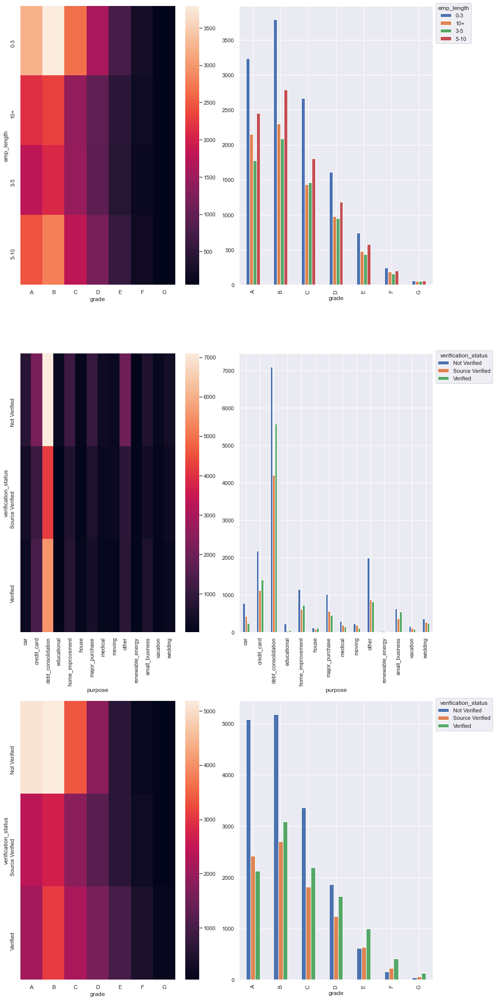

In [483]:
plot_cat_cat(cat_cat)

Variables: <b>grade, emp_length</b>
<br><u>Observations</u>:
<br>The count of borrowers with 0-3 years and 5-10 years experience, are more in every grade than others
<br>
<br><u>Analysis</u>:
<br>Company can grow its business by concentrating more on this segments by creating, marketing campaigns
<br>

<br>Variables: <b>purpose, verification_status</b>
<br><u>Observations</u>:
<br>There are more un-verified borrowers in each purpose category. 
<br>debt consolidation have the heighest number of unverified borrowers.
<br><u>Analysis</u>:
<br>Maybe this high percentage of unverified approvals are because of targets of the loan marketplace/investors.

<br>Variables: <b>grade, verification_status</b>
<br><u>Observations</u>:
<br>Grade A, B, C and D have more unverified borrowers.
<br>Grade E, F and G have more of verified borrowers.
<br><u>Analysis</u>:
<br>People are more scrutinized for lower grades of loan.

# Quantitative vs Quantitative Plots

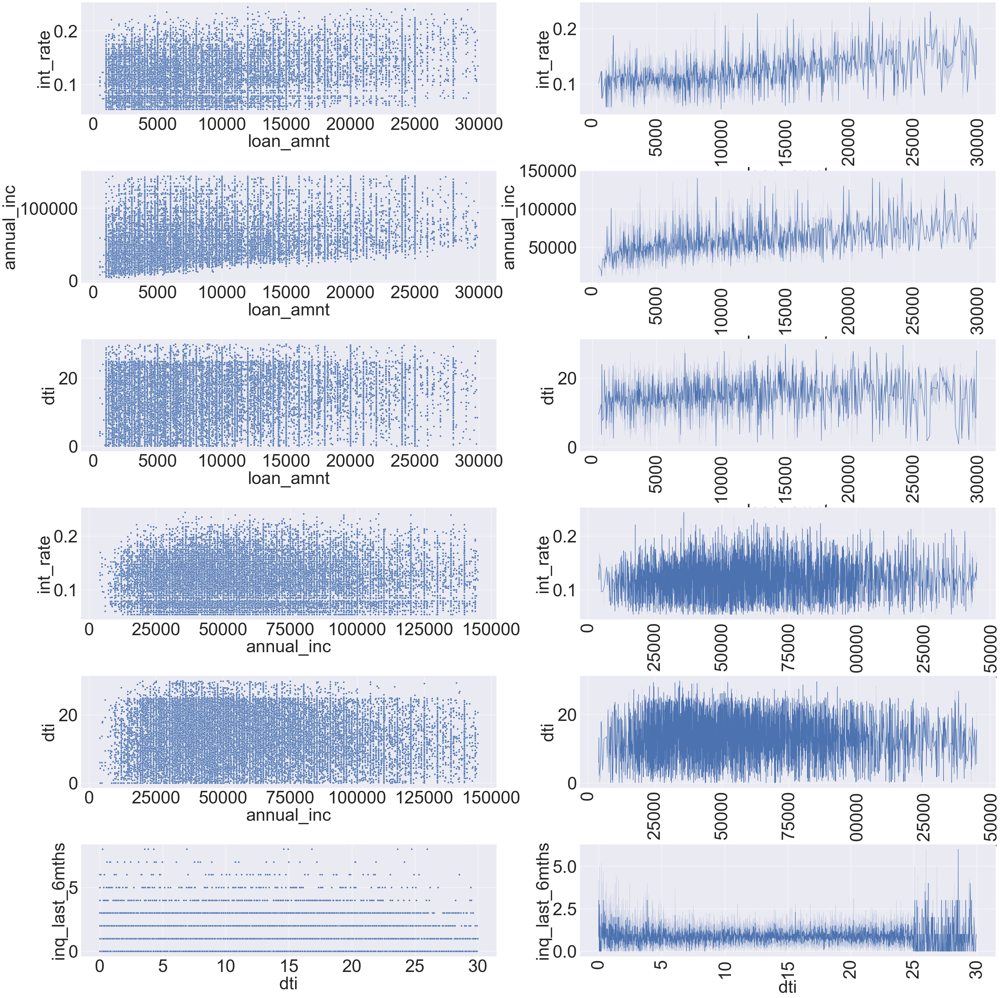

In [376]:
plot_quan_quan(quan_quan)

Variables: <b>['loan_amnt', 'int_rate']</b>
<br><u>Observations</u>:
<br> A large number of loans were taken with smaller smaller loan amount( <10000) with interest rates reaching lesser than 15%
<br><u>Analysis</u>:
<br> Most of the people are taking up loans near 10k, and are more attracted when interest rates are lesser than.

<br>Variables: <b>['loan_amnt', 'annual_inc']</b>
<br><u>Observations</u>:
<br> Borrowers with more annual income than 60k have opted for more than average loan amounts, but the  largest borrowers are those who makes between 40-50k annually
<br><u>Analysis</u>:
<br>  Borrowers with higher incomes can afford more, so they might decide to go ahead with hight amount of loans

<br>Variables: <b>['annual_inc', 'int_rate']</b>
<br><u>Observations</u>:
<br> There are more people who have taken the loan below 100k
<br> most of them are on interest rates lesser than 15%
<br><u>Analysis</u>:

### Pair Plot

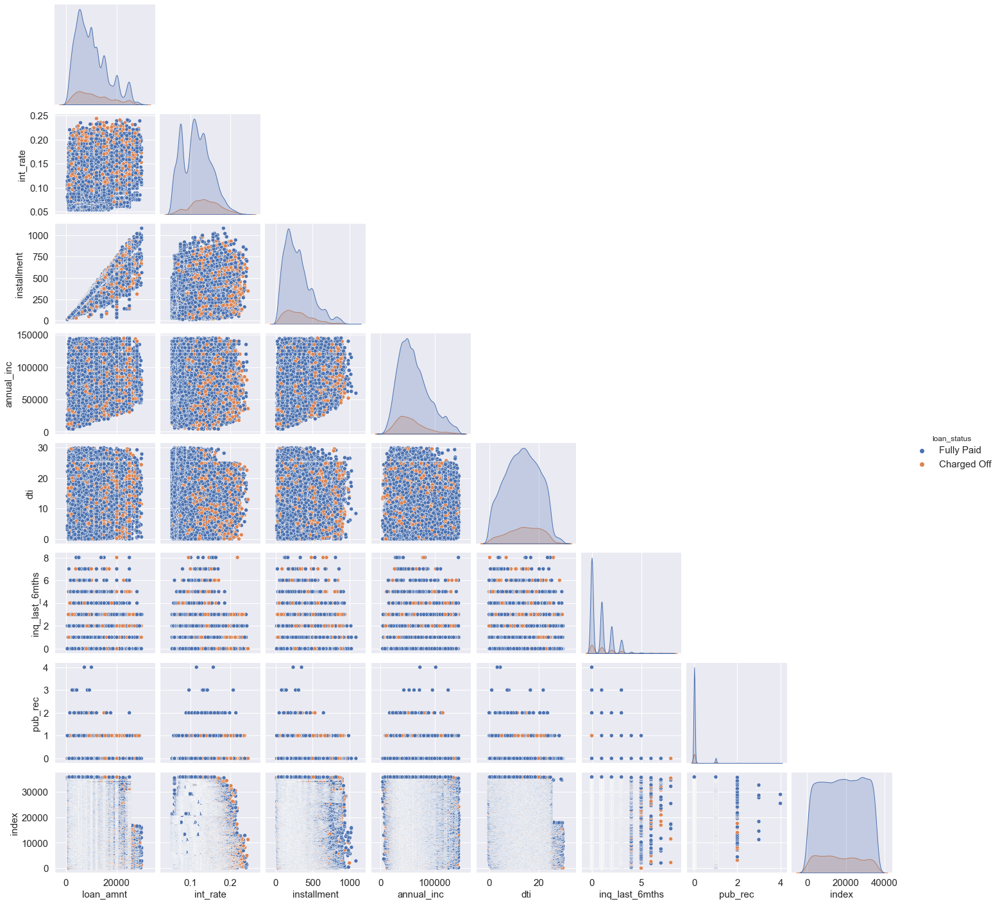

In [469]:
sns.pairplot(data[:-1], hue="loan_status", corner=True)

## Plots with Loan Status

<b>Categorical Variables</b> with loan_status

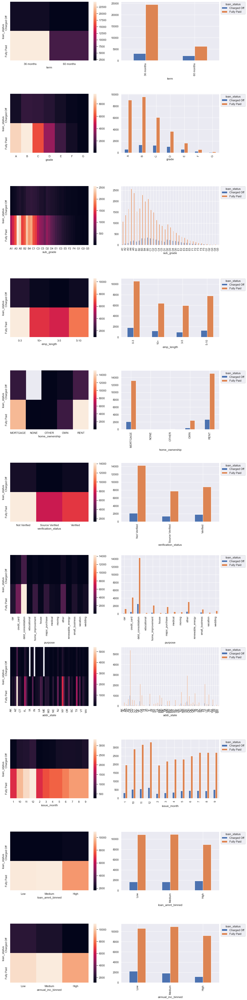

In [486]:
plot_cat_cat(loan_status_with_cat)

Variable: <b>term</b>
<br><u>Observations</u>:
<br> 33% of borrowers who had opted for 60 months term has defaulted
<br><u>Analysis</u>:
<br> which might have been because of unseeable financial situation that came along there way as it‚Äôs a long period of time

<br>Variable: <b>grade</b>
<br><u>Observations</u>:
<br>Borrowers from grade B, C and D have defaulted more than other grades, and grade G has the least defaulters
<br><u>Analysis</u>:
<br>blesser loans in G were taken in that category which in turn might have been because of high interest rate  charged on them as observed earlier.

<br>Variable: <b>emp_length</b>
<br><u>Observations</u>:
<br>The probability of borrowers with years of experience between 0-3 and 10+ defaulted is more than others comparatively.
<br> The highest number of people who taken yup loan are from 0-3 years category
<br><u>Analysis</u>:
<br> Because 0-3 years people are more prone to unstable income and 10+ years have many commitments and much expenses to handle, which in turn affects paying back the loan amount in many cases
<br>

<br>Variable: <b>home_ownership</b>
<br><u>Observations</u>:
<br> Most of the borrowers live on rent or have mortgage to pay and few of the actually own a house
<br><u>Analysis</u>:
<br>Looks like home ownership in not a major contributing factor in defining the defaulters as in all the cases, defaulting to non-defaulting percentage remains almost similar.

<br>Variable: <b>purpose</b>
<br><u>Observations</u>:
<br> 18% of the people who has opted for debt consolidation and 30% of who opted for small business has actually defaulted more which is comparatively high compared to purposes like credit card payments and small business.
<br>
<br><u>Analysis</u>:
<br> Debt consolidation has much defaulters as they already has other loans to be closed and run out of money as they are habituated to taking loans and small business might have defaulted as they ran out of funds due to losses
<br> Loans taken for renewable energy is very less as its a new technology and might not be aware of it.

<b>Quantitative Variable</b> with loan_status

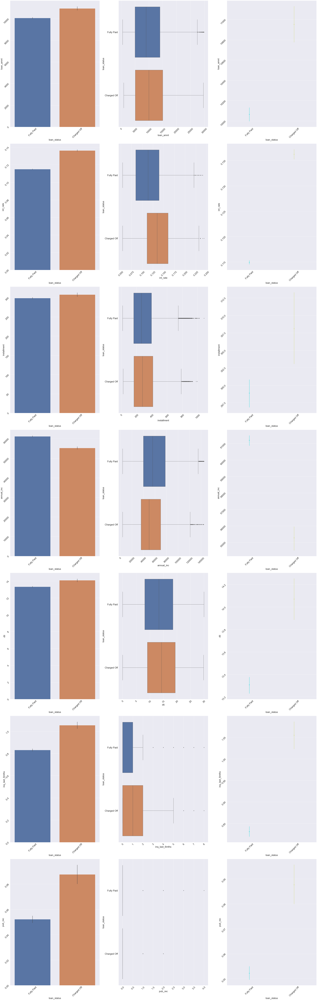

In [378]:
plot_quan_cat(loan_status_with_quant)

Variable: <b>loan_amnt</b>
<br><u>Observations</u>:
<br> loan amount when as high as 120k
<br>
<br><u>Analysis</u>:
<br> Cases of defaulters are more when the loan amount is higher than 100k, which might be because of difficulty while paying back that much of an higher amount in high interest and lower annual income cases 
<br>

<br>Variable: <b>int_rate</b>
<br><u>Observations</u>:
<br> Cases of defaulters has taken a plunge when the interest rates are higher than 13.5%
<br>
<br><u>Analysis</u>:
<br> Cases of defaulters has taken a plunge when the interest rates are higher than 12.5% and above, the possible reason could be that they might have felt that with that huge interest rates that they could never be able to pay off the principle and close the loan, so they defaulted.
<br>

<br>Variable: <b>inq_last_6mths</b>
<br><u>Observations</u>:
<br> The applicants for whom the number of inquiries in the last 6 months were equal to or more than 1, the chances of them being defaulters were more as per the analysis
<br>
<br><u>Analysis</u>:
<br> Which might be because people have taken other loans too recently and those EMIs piled up all together, which hindered his paying capability 
<br>

<br>Variable: <b>pub_rec</b>
<br><u>Observations</u>:
<br> The borrowers for whom pub rec count was equal to or more than 5, the chances of them being defaulters were more
<br>
<br><u>Analysis</u>:
<br> Which might be because people have taken other loans too recently and those EMIs piled up all together, which hindered his paying capability 
<br>

## Analysis of 2 variables and their impact on loan_status

In [ ]:
hue = 'loan_status' #setting hue variable

We are using the following combinations of variables:<br>
    
<table>
    <tr>
        <th> x axis <th>
        <th> y axis <th>
    <tr>
    <tr>
        <td> purpose <td>
        <td> dti <td>
    <tr>
    <tr>
        <td> annual_inc_binned <td>
        <td> dti <td>
    <tr>
    <tr>
        <td> grade <td>
        <td> dti <td>
    <tr>
    <tr>
        <td> annual_inc_binned <td>
        <td> int_rate <td>
    <tr>
    <tr>
        <td> grade <td>
        <td> int_rate <td>
    <tr>
<table>


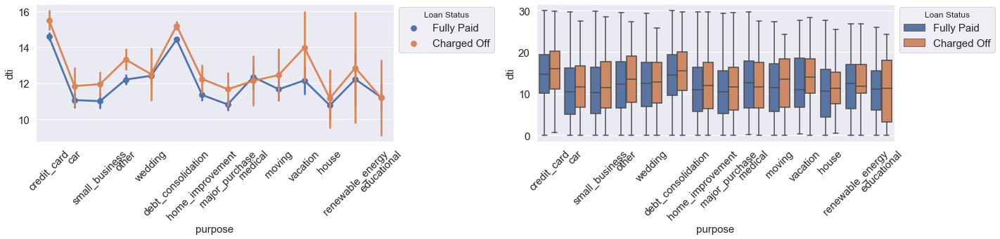

In [458]:
# dti, purpose
x = 'purpose'
y = 'dti'

plt.figure(figsize=(20, 5))
plt.subplot(1, 2, 1)
sns.pointplot(x=x, y=y, hue=hue, data=data)
plt.xticks(rotation=45)
plt.legend(title='Loan Status', bbox_to_anchor=(1, 1.02), loc='upper left')
plt.xlabel(x)
plt.ylabel(y)

plt.subplot(1, 2, 2)
sns.boxplot(x=x, y=y, hue=hue, data=data)
plt.xticks(rotation=45)
plt.legend(title='Loan Status', bbox_to_anchor=(1, 1.02), loc='upper left')
plt.xlabel(x)
plt.ylabel(y)

plt.tight_layout()

Variables: <b>dti, purpose</b>
<br><u>Observations</u>:
<br>Heighest dti was observed when people applied for credit card and debt consolidation loans - but higher the dti more chances for defaulting in bothe the cases
<br>dti values does not affect loan status for wedding, medical and education loans.
<br>Other than wedding, medical and education loans, usually higher dti can be a deciding factor for defaulting.
<br><u>Analysis</u>:
<br>Its straight forward from the observations that people who have having existing loans are having higher DTIs
<br>wedding, medical and education loans are not affected in terms of defaulting, this can be due to these being highly planned events

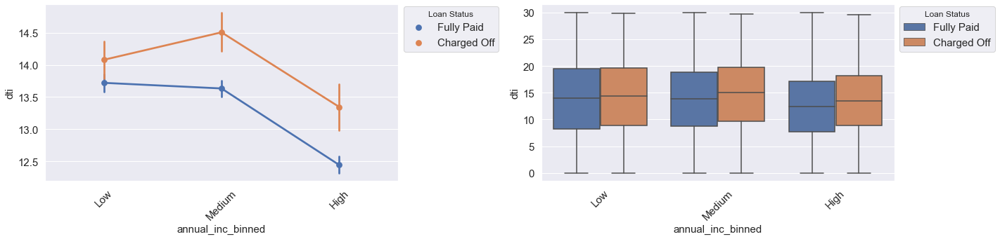

In [459]:
# dti, annual_inc_binned 
x = 'annual_inc_binned'
y = 'dti'

plt.figure(figsize=(20, 5))
plt.subplot(1, 2, 1)
sns.pointplot(x=x, y=y, hue=hue, data=data)
plt.xticks(rotation=45)
plt.legend(title='Loan Status', bbox_to_anchor=(1, 1.02), loc='upper left')
plt.xlabel(x)
plt.ylabel(y)

plt.subplot(1, 2, 2)
sns.boxplot(x=x, y=y, hue=hue, data=data)
plt.xticks(rotation=45)
plt.legend(title='Loan Status', bbox_to_anchor=(1, 1.02), loc='upper left')
plt.xlabel(x)
plt.ylabel(y)

plt.tight_layout()

Variables: <b>dti, annual_inc_binned</b>
<br><u>Observations</u>:
<br>Defaulters have higher dti than non-defaulters.
<br>For medium annual income, dti for fully paid loans actually decreased from low annual income, on the other hand it increased for defaulters. 
<br><u>Analysis</u>:
<br>more than average dti can be a factor for defaulters.
<br>Generally the dti trend should be downwards as, maybe beacuse of more purchasing power.

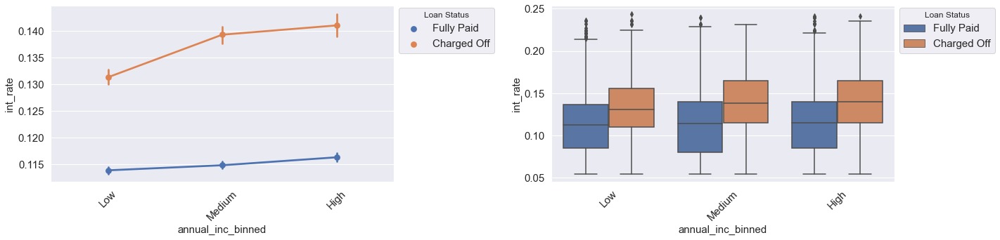

In [461]:
# int_rate, annual_inc_binned
x = 'annual_inc_binned'
y = 'int_rate'

plt.figure(figsize=(20, 5))
plt.subplot(1, 2, 1)
sns.pointplot(x=x, y=y, hue=hue, data=data)
plt.xticks(rotation=45)
plt.legend(title='Loan Status', bbox_to_anchor=(1, 1.02), loc='upper left')
plt.xlabel(x)
plt.ylabel(y)

plt.subplot(1, 2, 2)
sns.boxplot(x=x, y=y, hue=hue, data=data)
plt.xticks(rotation=45)
plt.legend(title='Loan Status', bbox_to_anchor=(1, 1.02), loc='upper left')
plt.xlabel(x)
plt.ylabel(y)

plt.tight_layout()

Variables: <b>int_rate, annual_inc_binned</b>
<br><u>Observations</u>:
<br>Higher interest rate(averaging >13) has more defaulters.
<br>Non-defaulters have average interest rate around 11%.
<br><u>Analysis</u>:
<br>Higher interest has more chances of turning up defaulters.

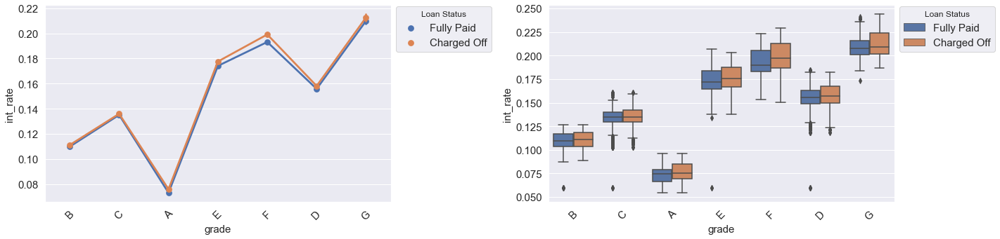

In [462]:
#  int_rate, grade
x = 'grade'
y = 'int_rate'

plt.figure(figsize=(20, 5))
plt.subplot(1, 2, 1)
sns.pointplot(x=x, y=y, hue=hue, data=data)
plt.xticks(rotation=45)
plt.legend(title='Loan Status', bbox_to_anchor=(1, 1.02), loc='upper left')
plt.xlabel(x)
plt.ylabel(y)

plt.subplot(1, 2, 2)
sns.boxplot(x=x, y=y, hue=hue, data=data)
plt.xticks(rotation=45)
plt.legend(title='Loan Status', bbox_to_anchor=(1, 1.02), loc='upper left')
plt.xlabel(x)
plt.ylabel(y)

plt.tight_layout()

Variables: <b>int_rate, grade</b>
<br><u>Observations</u>:
<br>Grade A has the lowest interest rates.
<br>As the grade goes from A to G, the interest rates goes up
<br>The average interest rates does not affect the loan defaulting in grade A, B and C, in others it's increase becomes a factor. 
<br><u>Analysis</u>:
<br>People from D, E, F and G are willing to take loans with more interest rates than their counter parts, which might be an indicator that they have no other option or they have complications/obligations while applying for loans and getting them approved so they don't bother about interest rates much.

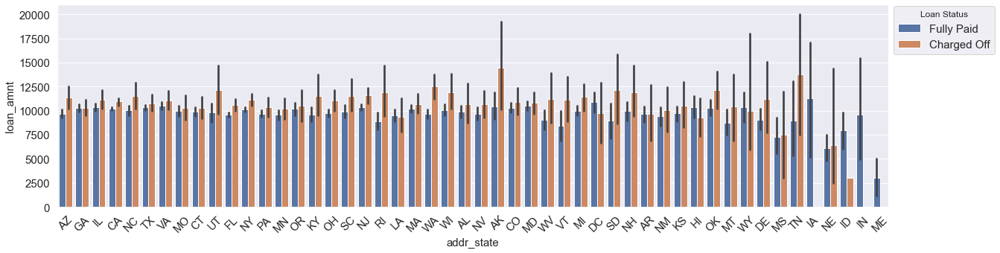

In [463]:
plt.figure(figsize=(20,5))
set_plot_stats(12, 15, 20)
sns.barplot(x='addr_state', y='loan_amnt', hue='loan_status',data=data, estimator=np.mean)
plt.legend(title='Loan Status', bbox_to_anchor=(1, 1.02), loc='upper left')
plt.xticks(rotation=45)
plt.show()

Variables: <b></b>
<br><u>Observations</u>:
<br>On an average borrowers from AK and TN are more probable to default.
<br>Borrowers from IA, IN, ME are more likely to pay there loans in full.

# END OF ANALYSIS

<b><h1>Recomendations</h1></b>
<ol>
    <li>Loans of <b>60 terms</b> should be limited for someone with being a defaulter profiler</li>
    <li>Bank should avoid approving loan for someone with <b>pub rec</b> value >= 5</li>
    <li>Borrowers for whom the <b>number of inquiries</b> in the last 6 months were >=1 should be not encouraged much</li>
    <li>Loans for which <b>Interest rates</b> are higher than 12% and above, the investor can expect a higher risk and decide whether to proceed or step back.</li>
    <li>Investors should be very cautious while the <b>loan amounts</b> are above 100k, in possible situations they should be avoided</li>
    <li>More than 20% of loans taken on purpose of <b>debt consolidation and small business</b> have defaulted so, considering all the above factors for these applicants is very crucial to avoid any losses.</li>
    <li>Approving the lesser than eligible amount for <b>0-3 years and 10+ experienced</b> applicants would be a better choice as they defaulted the most compared to others.</li>
    <li>Borrowers from <b>grade B, C and D</b> have defaulted more , so considering the important factors that in increases the probability of him being a defaulter should be evaluated thoroughly</li>
    <li><b>dti</b> on an average should decrease as the income bar increases. It should preferably be less than 13.7</li>
    <li>borrowers from <b>AK and TN states</b> should given loan after verified other factors mentioned here.</li>
</ol>    